# Evaluation Project - 7: Rainfall Prediction - Weather Forecasting

#### Problem Statement:
### Rain Prediction –Weather forecasting

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 
- __Target:__

    a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

    b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


##### Dataset Description:

__Number of columns: 23__


- __Date__  - The date of observation

- __Location__  -The common name of the location of the weather station

- __MinTemp__  -The minimum temperature in degrees celsius

- __MaxTemp__ -The maximum temperature in degrees celsius

- __Rainfall__  -The amount of rainfall recorded for the day in mm

- __Evaporation__  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

- __Sunshine__  -The number of hours of bright sunshine in the day.

- __WindGustDir__- The direction of the strongest wind gust in the 24 hours to midnight

- __WindGustSpeed__ -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

- __WindDir9am__ -Direction of the wind at 9am

- __WindDir3pm__ -Direction of the wind at 3pm

- __WindSpeed9am__ -Wind speed (km/hr) averaged over 10 minutes prior to 9am

- __WindSpeed3pm__ -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

- __Humidity9am__ -Humidity (percent) at 9am

- __Humidity3pm__ -Humidity (percent) at 3pm

- __Pressure9am__ -Atmospheric pressure (hpa) reduced to mean sea level at 9am

- __Pressure3pm__ -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

- __Cloud9am__ - Fraction of sky obscured by cloud at 9am. 

- __Cloud3pm__ -Fraction of sky obscured by cloud 

- __Temp9am__-Temperature (degrees C) at 9am

- __Temp3pm__ -Temperature (degrees C) at 3pm

- __RainToday__ -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

- __RainTomorrow__ -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".



## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
from scipy.stats import zscore
from sklearn.preprocessing  import power_transform, StandardScaler, LabelEncoder
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_classif
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor,Ridge, Lasso
from sklearn.metrics import roc_curve, auc, roc_auc_score,plot_roc_curve, r2_score, accuracy_score,classification_report, confusion_matrix, mean_absolute_error, mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.svm import SVR, SVC
from sklearn.tree import DecisionTreeClassifier
import pickle
import warnings
warnings.filterwarnings('ignore')

## Importing the DATASET

In [2]:
weather=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")

### Checking Top 5 rows Data

In [3]:
weather.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# EDA

## Checking Total Numbers of Rows and Column

In [4]:
weather.shape

(8425, 23)

## Checking All Column Names

In [5]:
weather.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

## Checking Data Type of All Data

In [6]:
weather.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

## Checking for Null Values

In [7]:
weather.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

###### We can see except 2 columns Null Value is present in all columns and column name are: 

    'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
    'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
    'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow'

### Checking for Null Values through heatmap also

<AxesSubplot:>

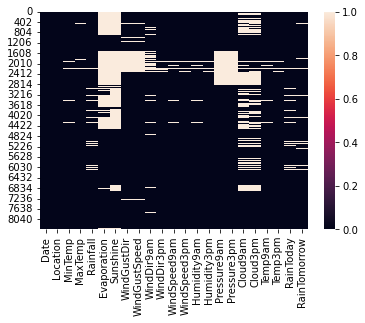

In [8]:
sns.heatmap(weather.isnull())

We can see here also that Null Values are present in our dataset.

## Information about Data (Memory Used and Data Types)

In [9]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

### Checking for ? values if present in our dataset or not

In [10]:
(weather==' ?').sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

###### We can see there are no ? values present in our dataset

### Checking whether the dataset contains any space

In [11]:
weather[weather['RainTomorrow'] == '']

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow


In [12]:
weather[weather['Rainfall'] == '']

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow


So we can see there are no spaces present in the dataset.

### Checking for blank value in our Target Column

In [13]:
weather[weather['RainTomorrow'] == ''].index

Int64Index([], dtype='int64')

In [14]:
weather[weather['Rainfall'] == ''].index

Int64Index([], dtype='int64')

So, we can check there are no blank value present in our Target Column

### Checking values of Target Variable.

In [15]:
weather['RainTomorrow'].value_counts()

No     6195
Yes    1991
Name: RainTomorrow, dtype: int64

In [16]:
weather['Rainfall'].value_counts()

0.0      5299
0.2       406
0.4       177
0.6       116
1.2        86
         ... 
61.2        1
128.0       1
90.0        1
34.4        1
40.0        1
Name: Rainfall, Length: 250, dtype: int64

### Checking unique values present in the Target Variable.

In [17]:
weather['RainTomorrow'].unique()

array(['No', 'Yes', nan], dtype=object)

In [18]:
weather['Rainfall'].unique()

array([6.000e-01, 0.000e+00, 1.000e+00, 2.000e-01, 1.400e+00, 2.200e+00,
       1.560e+01, 3.600e+00,       nan, 1.680e+01, 1.060e+01, 1.200e+00,
       8.000e-01, 6.400e+00, 4.000e-01, 3.000e+00, 5.800e+00, 1.160e+01,
       1.800e+00, 8.600e+00, 1.260e+01, 8.400e+00, 6.200e+00, 2.000e+01,
       2.100e+01, 3.200e+00, 4.800e+00, 4.200e+00, 8.000e+00, 1.440e+01,
       4.600e+00, 2.000e+00, 5.600e+00, 1.600e+00, 6.000e+00, 4.400e+00,
       5.400e+00, 5.000e+00, 7.800e+00, 6.800e+00, 9.800e+00, 3.800e+00,
       2.400e+00, 5.200e+00, 6.600e+00, 1.340e+01, 1.020e+01, 2.880e+01,
       7.000e+00, 2.580e+01, 9.400e+00, 1.240e+01, 5.220e+01, 2.060e+01,
       6.600e+01, 1.100e+01, 1.700e+01, 1.040e+01, 2.800e+01, 2.140e+01,
       1.860e+01, 7.200e+00, 8.200e+00, 1.080e+01, 1.540e+01, 9.600e+00,
       4.000e+00, 2.180e+01, 2.080e+01, 2.480e+01, 1.000e+01, 1.140e+01,
       1.900e+01, 2.220e+01, 3.280e+01, 3.400e+00, 5.080e+01, 5.260e+01,
       1.920e+01, 1.880e+01, 1.480e+01, 1.200e+01, 

In [19]:
weather['RainTomorrow'].nunique()

2

In [20]:
weather['Rainfall'].nunique()

250

### Checking unique elements of each columns

In [21]:
weather.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

# Descriptive Statistics

In [22]:
# Description of Dataset : works only on continuous column 
weather.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


- So, we can see that only 16 column is containing continuous data and rest 7 column contains categorical data.

### Checking Description through heatmap also.

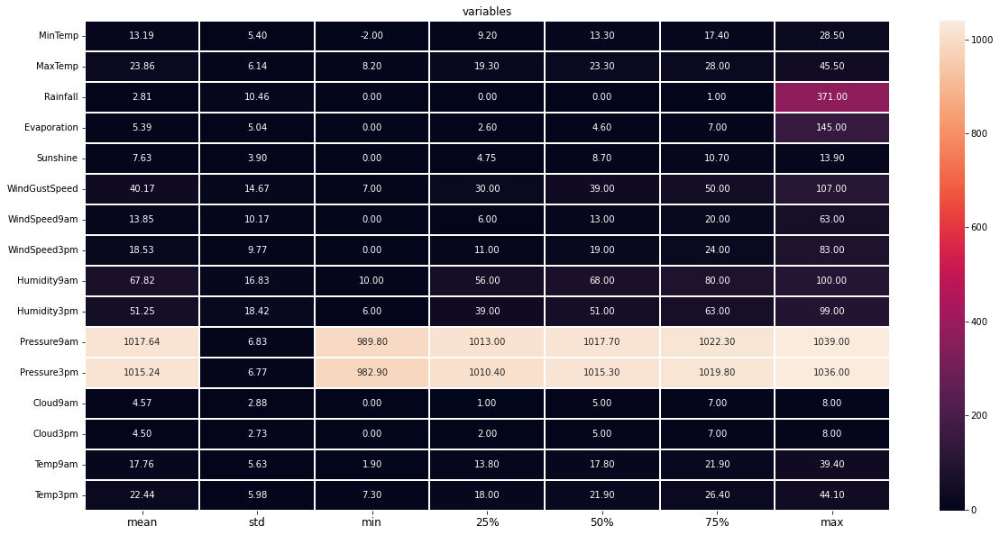

In [23]:
plt.figure(figsize=(20,10))
sns.heatmap(round(weather.describe()[1:].transpose(),2),linewidth=2,annot=True,fmt='.2f')
plt.xticks(fontsize=18)
plt.xticks(fontsize=12)
plt.title('variables')
plt.show()

#### Observation of Describe of Datasets:
- The summary of this dataset looks good as there are no negative value present.
- Total No of Rows: 8425 and Total No. of Columns: 23
- We can see there are null values present in our dataset as Total count is not matching with Total no of rows of our datset of all continuous columns: MinTemp, MaxTemp, Rainfall,	Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm.
- We are determining Mean, Standard Deviation, Minimum and Maximum Values of each column in description of dataset.
- We can also see skewness and outliers are present.

# Data Cleaning and preprocessing

Since there are Null values in the dataset, so we need to treat them.

#### checking total percentage of null values in each column of dataset

In [24]:
weather.isnull().sum()/weather.shape[0]*100

Date              0.000000
Location          0.000000
MinTemp           0.890208
MaxTemp           0.712166
Rainfall          2.848665
Evaporation      41.685460
Sunshine         47.406528
WindGustDir      11.762611
WindGustSpeed    11.762611
WindDir9am        9.839763
WindDir3pm        3.655786
WindSpeed9am      0.902077
WindSpeed3pm      1.270030
Humidity9am       0.700297
Humidity3pm       1.210682
Pressure9am      15.537092
Pressure3pm      15.572700
Cloud9am         28.735905
Cloud3pm         29.139466
Temp9am           0.664688
Temp3pm           1.139466
RainToday         2.848665
RainTomorrow      2.836795
dtype: float64

In [25]:
weather['Evaporation'].value_counts()

4.0     180
3.0     163
2.4     147
2.2     146
2.6     143
       ... 
17.0      1
18.6      1
22.4      1
19.2      1
0.7       1
Name: Evaporation, Length: 116, dtype: int64

In [26]:
weather['Sunshine'].value_counts()

0.0     166
11.1     68
11.2     67
11.0     66
10.7     64
       ... 
2.5       8
13.6      7
13.8      4
13.9      3
13.5      2
Name: Sunshine, Length: 140, dtype: int64

In [27]:
weather['Cloud9am'].value_counts()

7.0    1418
1.0    1038
8.0    1015
0.0     554
6.0     551
5.0     414
3.0     384
2.0     357
4.0     273
Name: Cloud9am, dtype: int64

In [28]:
weather['Cloud3pm'].value_counts()

7.0    1294
1.0    1077
8.0     863
6.0     597
5.0     522
2.0     508
3.0     411
4.0     351
0.0     347
Name: Cloud3pm, dtype: int64

We observe that the 4 columns(Evaporation,Sunshine,Cloud9am,Cloud3pm) have less than 50% missing data.  If we drop these column then our approx 50% data will be lost, So we’ll use them in our model with proper imputation and will drop rest column's rows.

In [29]:
def randomsampleimputation(weather, variable):
    weather[variable]=weather[variable]
    random_sample=weather[variable].dropna().sample(weather[variable].isnull().sum(),random_state=0)
    random_sample.index=weather[weather[variable].isnull()].index
    weather.loc[weather[variable].isnull(),variable]=random_sample
    
    
randomsampleimputation(weather, "Cloud9am")
randomsampleimputation(weather, "Cloud3pm")
randomsampleimputation(weather, "Evaporation")
randomsampleimputation(weather, "Sunshine")

In [30]:
#checking again null values after imputation
weather.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation         0
Sunshine            0
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am            0
Cloud3pm            0
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [31]:
#droping rows containg null values
weather.dropna(inplace=True)

In [32]:
#checking again null values after droping rows
weather.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

So, now we can see that null values are handeled. 

In [33]:
#Reseting the index
weather.reset_index(inplace=True,drop=True)

In [34]:
#checking again total no of rows and column
weather.shape

(6332, 23)

### Converting Datatype of 'Date' Column

In [35]:
#Converting dayatype of 'Date' column from object datatype to datetime datatype
weather['Date']=pd.to_datetime(weather['Date']) 

### Extracting 'Day' column from 'Date' Column

In [36]:
#mapping day values to 'Day' column in main dataframe
weather['Day']=weather['Date'].apply(lambda d:d.day) 

### Extracting 'Month' column from 'Date' Column

In [37]:
#mapping month values to 'Month' column in main dataframe
weather['Month']=weather['Date'].apply(lambda m:m.month) 

### Extracting 'Year' column from 'Date' Column

In [38]:
 #mapping Year values to 'Year' column in main Date
weather['Year']=weather['Date'].apply(lambda y:y.year)

### Checking again top 5 rows of dataset

In [39]:
weather.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,2008-12-01,Albury,13.4,22.9,0.6,3.0,13.8,W,44.0,W,...,1007.1,8.0,8.0,16.9,21.8,No,No,1,12,2008
1,2008-12-02,Albury,7.4,25.1,0.0,2.2,7.6,WNW,44.0,NNW,...,1007.8,1.0,4.0,17.2,24.3,No,No,2,12,2008
2,2008-12-03,Albury,12.9,25.7,0.0,4.6,7.7,WSW,46.0,W,...,1008.7,2.0,2.0,21.0,23.2,No,No,3,12,2008
3,2008-12-04,Albury,9.2,28.0,0.0,1.8,8.0,NE,24.0,SE,...,1012.8,8.0,7.0,18.1,26.5,No,No,4,12,2008
4,2008-12-05,Albury,17.5,32.3,1.0,3.8,11.9,W,41.0,ENE,...,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008


### Droping 'Date' Column

In [40]:
weather=weather.drop(columns="Date", axis=1)

In [41]:
weather.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

In [42]:
weather.shape

(6332, 25)

# Data Visualization
## Univariate Analysis
### Using Countplot for categorical columns

Melbourne       1400
PerthAirport    1164
Williamtown     1044
Albury           700
CoffsHarbour     563
Brisbane         544
Wollongong       446
Darwin           250
Adelaide         185
Uluru             36
Name: Location, dtype: int64


<AxesSubplot:xlabel='Location', ylabel='count'>

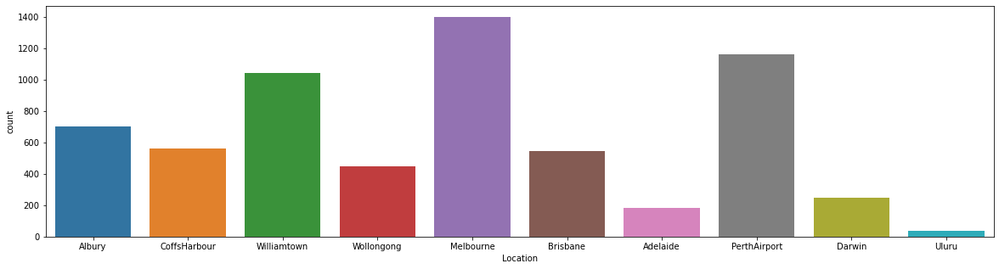

In [43]:
#Count Plot for "Location" column
print(weather["Location"].value_counts())
plt.figure(figsize=(20,5))
sns.countplot("Location",data=weather)

'Melbourne' is the most common name of the location of the weather station and 'Uluru' is least

N      621
E      511
SW     495
S      495
SSE    470
WNW    454
W      435
WSW    427
SE     401
ENE    339
SSW    338
NW     336
NE     300
NNE    279
ESE    249
NNW    182
Name: WindGustDir, dtype: int64


<AxesSubplot:xlabel='WindGustDir', ylabel='count'>

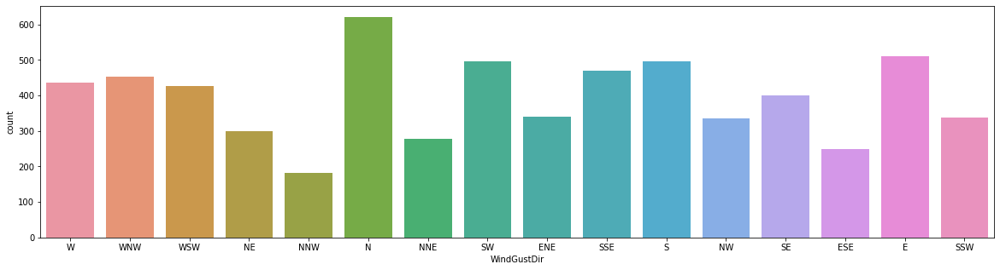

In [44]:
#Count Plot for "WindGustDir" column
print(weather["WindGustDir"].value_counts())
plt.figure(figsize=(20,5))
sns.countplot("WindGustDir",data=weather)

The direction of the strongest wind gust in the 24 hours to midnight is in N most and in NNW least.

N      751
SW     560
WSW    479
WNW    424
NW     416
ENE    407
SE     397
NNE    391
W      376
SSW    373
E      356
S      330
SSE    317
NE     303
ESE    227
NNW    225
Name: WindDir9am, dtype: int64


<AxesSubplot:xlabel='WindDir9am', ylabel='count'>

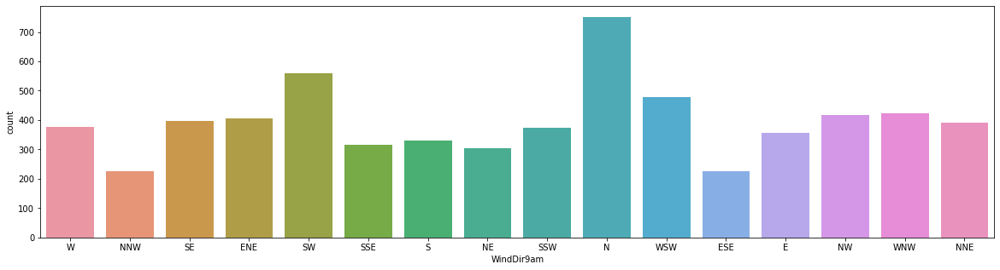

In [45]:
#Count Plot for "WindDir9am" column
print(weather["WindDir9am"].value_counts())
plt.figure(figsize=(20,5))
sns.countplot("WindDir9am",data=weather)

Direction of the wind at 9am is also strong in N and least in NNW

S      601
SSE    540
WSW    501
N      447
SE     437
WNW    413
W      405
E      397
SW     382
ESE    381
NE     366
ENE    339
NNE    297
SSW    292
NW     275
NNW    259
Name: WindDir3pm, dtype: int64


<AxesSubplot:xlabel='WindDir3pm', ylabel='count'>

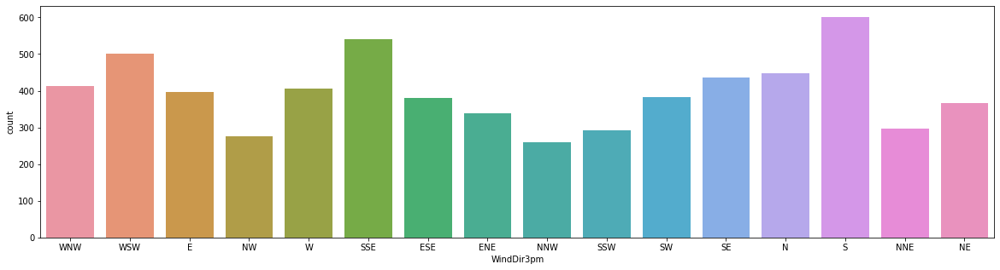

In [46]:
#Count Plot for "WindDir3pm" column
print(weather["WindDir3pm"].value_counts())
plt.figure(figsize=(20,5))
sns.countplot("WindDir3pm",data=weather)

Direction of the wind at 3pm is strong in S and least in NNW

No     4778
Yes    1554
Name: RainToday, dtype: int64


<AxesSubplot:xlabel='RainToday', ylabel='count'>

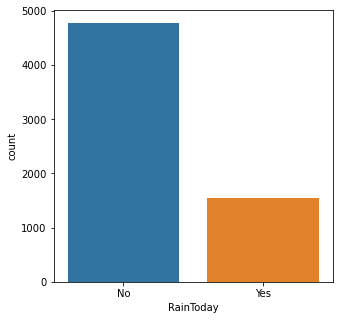

In [47]:
#Count Plot for "RainToday" column
print(weather["RainToday"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("RainToday",data=weather)

No RainToday is highest compare to RainToday

No     4796
Yes    1536
Name: RainTomorrow, dtype: int64


<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

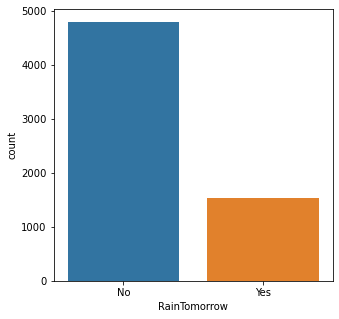

In [48]:
#Count Plot for "RainTomorrow" column
print(weather["RainTomorrow"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("RainTomorrow",data=weather)

No RainTomorrow is highest compare to RainTomorrow

### Using Histplot for Continuous Column

 12.7    58
 13.7    53
 12.0    53
 16.4    53
 13.2    52
         ..
 0.0      1
-0.5      1
-0.8      1
-0.6      1
 26.0     1
Name: MinTemp, Length: 276, dtype: int64


<AxesSubplot:xlabel='MinTemp', ylabel='Count'>

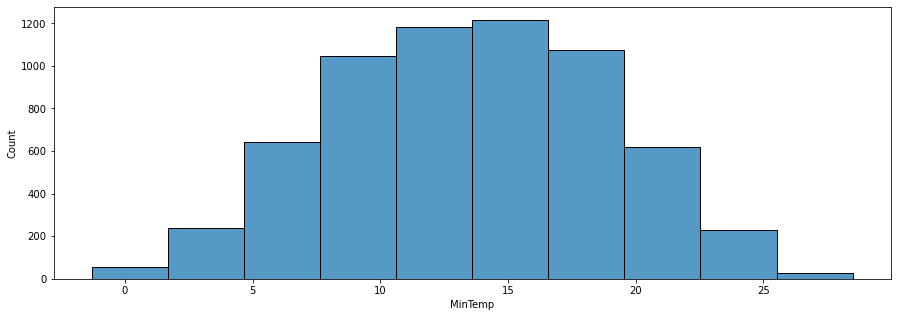

In [49]:
#Histplot for "MinTemp" column
print(weather["MinTemp"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='MinTemp',data=weather,bins=10)

12.7 degrees celsius is the highest minimum temperature.

19.0    66
22.0    59
22.3    56
23.8    51
23.4    51
        ..
10.0     1
10.4     1
11.7     1
10.7     1
43.5     1
Name: MaxTemp, Length: 328, dtype: int64


<AxesSubplot:xlabel='MaxTemp', ylabel='Count'>

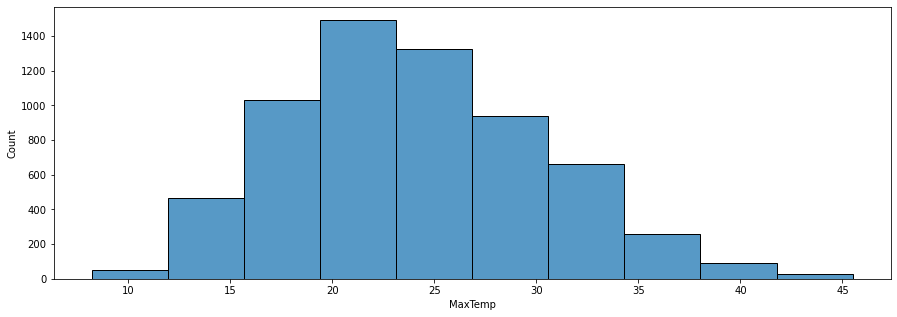

In [50]:
#Histplot for "MaxTemp" column
print(weather["MaxTemp"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='MaxTemp',data=weather,bins=10)

19.0 degrees celsius is the highest maximum temperature. 

0.0     4173
0.2      274
0.4      138
0.6       85
1.4       72
        ... 
19.8       1
39.8       1
51.0       1
35.0       1
20.4       1
Name: Rainfall, Length: 222, dtype: int64


<AxesSubplot:xlabel='Rainfall', ylabel='Count'>

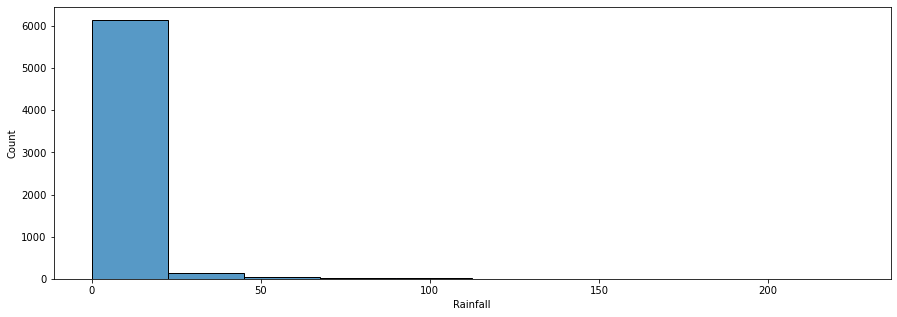

In [51]:
#Histplot for "Rainfall" column
print(weather["Rainfall"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Rainfall',data=weather,bins=10)

0.0 mm rainfall is maximum rainfall recorded for the day.

4.0     231
3.0     205
2.2     194
2.4     186
3.2     185
       ... 
17.0      1
14.0      1
15.0      1
15.6      1
0.7       1
Name: Evaporation, Length: 115, dtype: int64


<AxesSubplot:xlabel='Evaporation', ylabel='Count'>

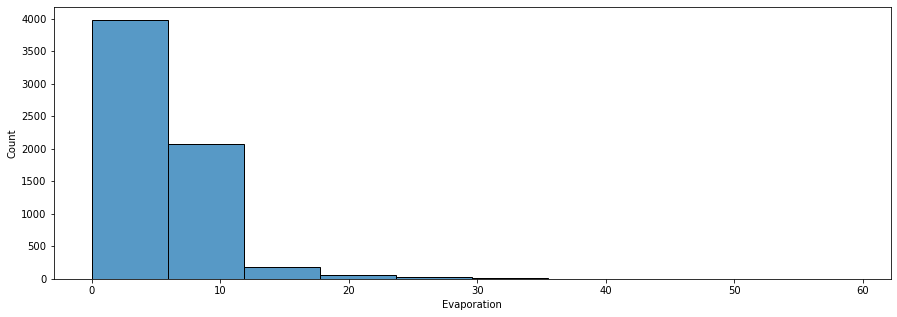

In [52]:
#Histplot for "Evaporation" column
print(weather["Evaporation"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Evaporation',data=weather,bins=10)

Maximum 4.0 mm Evaporation happens in the 24 hours to 9am

0.0     231
11.0    101
11.1    100
11.2     99
10.7     95
       ... 
2.5      11
1.7      11
13.8      6
13.9      4
13.5      3
Name: Sunshine, Length: 140, dtype: int64


<AxesSubplot:xlabel='Sunshine', ylabel='Count'>

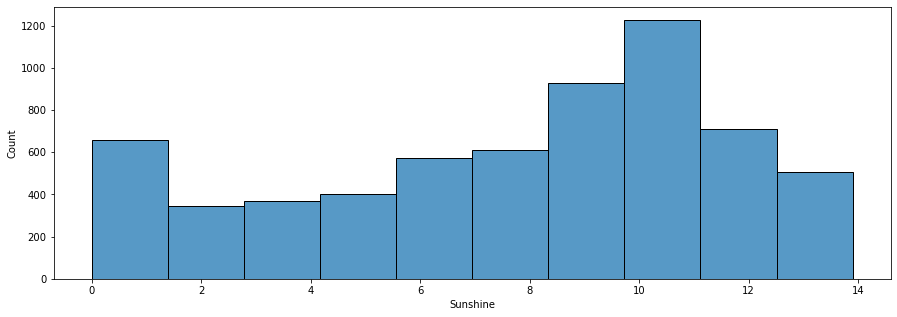

In [53]:
#Histplot for "Sunshine" column
print(weather["Sunshine"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Sunshine',data=weather,bins=10)

0.00 hours is the highest bright sunshine in the day.

39.0     397
37.0     394
35.0     388
33.0     363
41.0     327
31.0     325
30.0     319
43.0     270
28.0     270
48.0     265
50.0     230
52.0     229
46.0     225
44.0     216
26.0     214
24.0     191
54.0     187
22.0     164
56.0     139
20.0     135
57.0     133
61.0     104
59.0     101
19.0      92
63.0      82
65.0      72
72.0      58
17.0      55
67.0      54
70.0      50
74.0      49
76.0      44
69.0      43
15.0      25
78.0      21
80.0      20
85.0      14
81.0      13
13.0      13
91.0      12
89.0       7
93.0       4
98.0       4
87.0       3
83.0       3
94.0       3
11.0       2
102.0      2
107.0      1
Name: WindGustSpeed, dtype: int64


<AxesSubplot:xlabel='WindGustSpeed', ylabel='Count'>

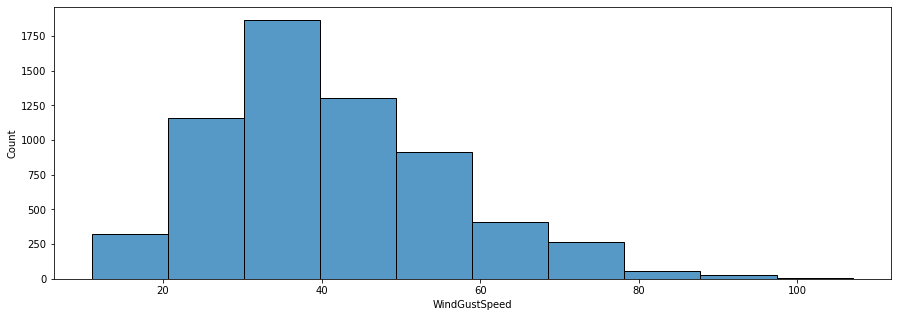

In [54]:
#Histplot for "WindGustSpeed" column
print(weather["WindGustSpeed"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='WindGustSpeed',data=weather,bins=10)

39.0(km/h) is the hoghest speed of the strongest wind gust in the 24 hours to midnight

13.0    637
9.0     624
11.0    548
7.0     501
6.0     438
17.0    426
15.0    413
20.0    392
19.0    355
24.0    285
4.0     275
22.0    257
26.0    198
28.0    189
2.0     178
31.0    146
30.0    102
35.0     75
33.0     65
41.0     47
37.0     41
39.0     29
43.0     27
44.0     25
52.0     16
46.0     15
50.0     10
56.0      6
54.0      4
48.0      4
61.0      2
57.0      2
Name: WindSpeed9am, dtype: int64


<AxesSubplot:xlabel='WindSpeed9am', ylabel='Count'>

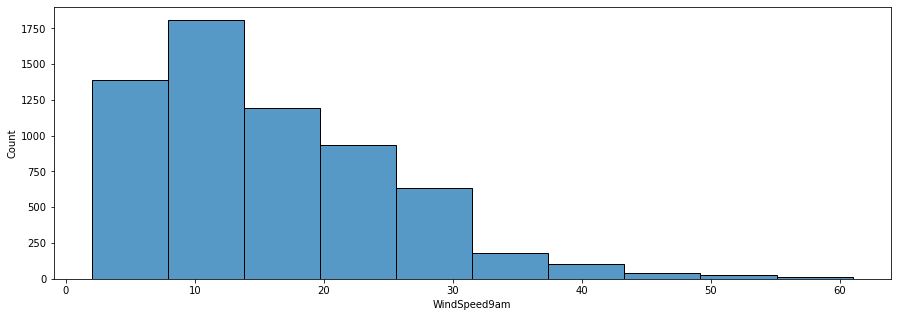

In [55]:
#Histplot for "WindSpeed9am" column
print(weather["WindSpeed9am"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='WindSpeed9am',data=weather,bins=10)

13.0(km/hr) is the highest Wind speed averaged over 10 minutes prior to 9am

20.0    521
13.0    501
17.0    487
24.0    460
19.0    457
15.0    444
11.0    427
9.0     426
22.0    392
28.0    354
26.0    342
30.0    245
31.0    239
7.0     220
33.0    155
6.0     145
35.0    128
37.0     94
4.0      68
39.0     68
41.0     37
43.0     31
2.0      28
46.0     19
44.0     16
48.0      9
52.0      7
50.0      6
56.0      2
54.0      2
61.0      2
Name: WindSpeed3pm, dtype: int64


<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Count'>

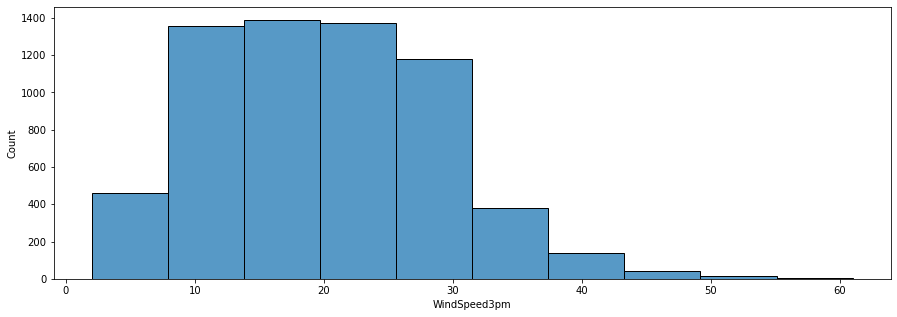

In [56]:
#Histplot for "WindSpeed3pm" column
print(weather["WindSpeed3pm"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='WindSpeed3pm',data=weather,bins=10)

20.0(km/hr) is the highest Wind speed averaged over 10 minutes prior to 3pm

62.0    165
67.0    154
61.0    148
64.0    147
74.0    146
       ... 
16.0      2
11.0      2
10.0      1
14.0      1
15.0      1
Name: Humidity9am, Length: 90, dtype: int64


<AxesSubplot:xlabel='Humidity9am', ylabel='Count'>

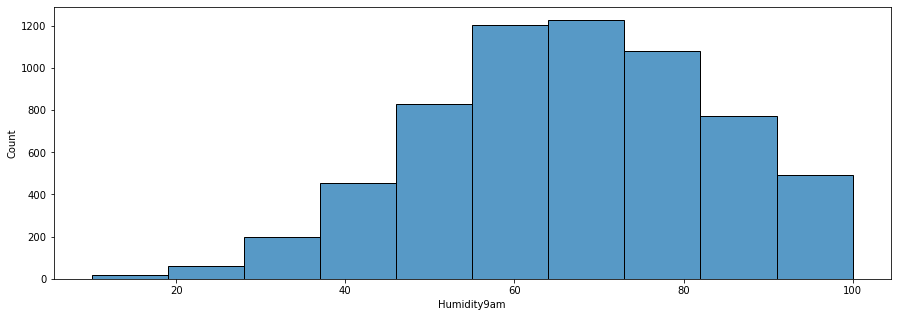

In [57]:
#Histplot for "Humidity9am" column
print(weather["Humidity9am"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Humidity9am',data=weather,bins=10)

62.0(percent) is the highest Humidity at 9am

49.0    162
54.0    155
55.0    148
53.0    147
40.0    147
       ... 
96.0      9
97.0      8
98.0      3
99.0      2
6.0       2
Name: Humidity3pm, Length: 94, dtype: int64


<AxesSubplot:xlabel='Humidity3pm', ylabel='Count'>

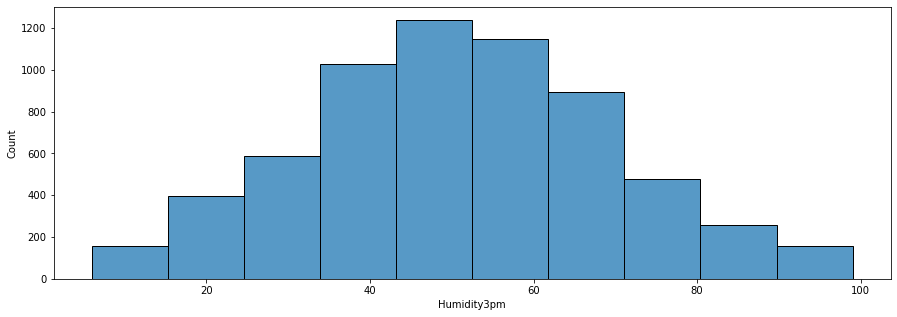

In [58]:
#Histplot for "Humidity3pm" column
print(weather["Humidity3pm"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Humidity3pm',data=weather,bins=10)

49.0(percent) is the highest Humidity  at 3pm

1014.8    49
1019.2    49
1017.1    48
1020.0    47
1015.7    45
          ..
998.8      1
989.8      1
1029.4     1
1036.3     1
1033.6     1
Name: Pressure9am, Length: 374, dtype: int64


<AxesSubplot:xlabel='Pressure9am', ylabel='Count'>

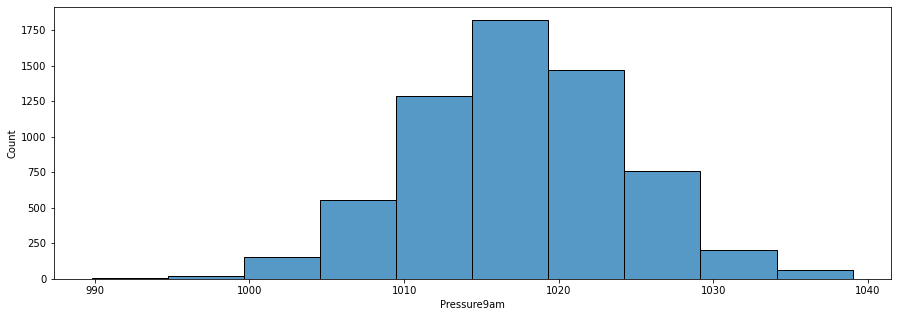

In [59]:
#Histplot for "Pressure9am" column
print(weather["Pressure9am"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Pressure9am',data=weather,bins=10)

1014.8 (hpa) is the highest Atmospheric pressure reduced to mean sea level at 9am

1017.8    55
1019.8    53
1017.9    52
1015.5    50
1011.1    50
          ..
998.9      1
1033.6     1
994.3      1
982.9      1
1029.5     1
Name: Pressure3pm, Length: 369, dtype: int64


<AxesSubplot:xlabel='Pressure3pm', ylabel='Count'>

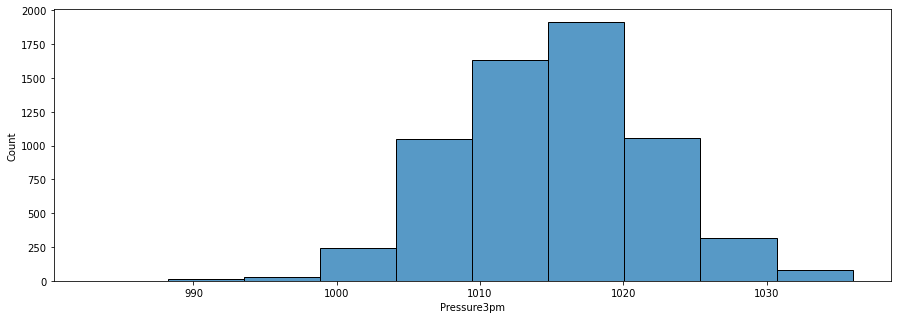

In [60]:
#Histplot for "Pressure3pm" column
print(weather["Pressure3pm"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Pressure3pm',data=weather,bins=10)

1017.8 (hpa) is the highest Atmospheric pressure reduced to mean sea level at 3pm

7.0    1589
1.0    1098
8.0    1004
6.0     559
0.0     518
5.0     448
3.0     423
2.0     401
4.0     292
Name: Cloud9am, dtype: int64


<AxesSubplot:xlabel='Cloud9am', ylabel='Count'>

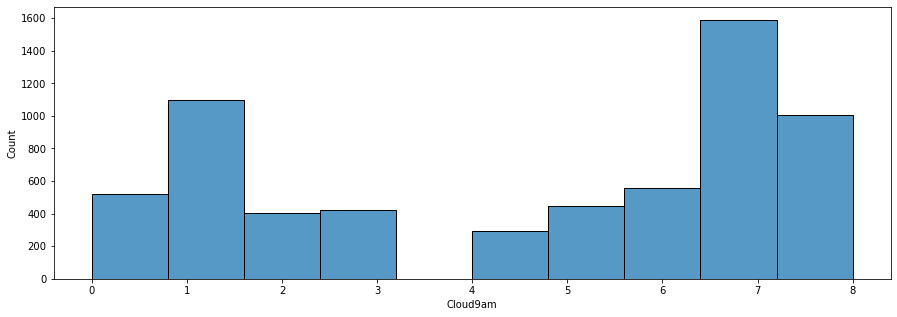

In [61]:
#Histplot for "Cloud9am" column
print(weather["Cloud9am"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Cloud9am',data=weather,bins=10)

7.0 is the highest Fraction of sky obscured by cloud at 9am.

7.0    1453
1.0    1145
8.0     899
6.0     590
2.0     554
5.0     529
3.0     428
4.0     387
0.0     347
Name: Cloud3pm, dtype: int64


<AxesSubplot:xlabel='Cloud3pm', ylabel='Count'>

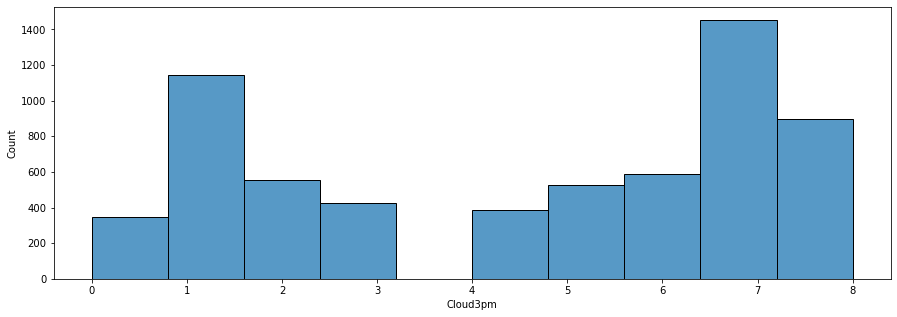

In [62]:
#Histplot for "Cloud3pm" column
print(weather["Cloud3pm"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Cloud3pm',data=weather,bins=10)

7.0 is the highest Fraction of sky obscured by cloud at 3PM

14.8    63
13.8    55
16.2    54
18.3    54
16.6    53
        ..
4.9      1
2.8      1
3.4      1
5.7      1
30.2     1
Name: Temp9am, Length: 292, dtype: int64


<AxesSubplot:xlabel='Temp9am', ylabel='Count'>

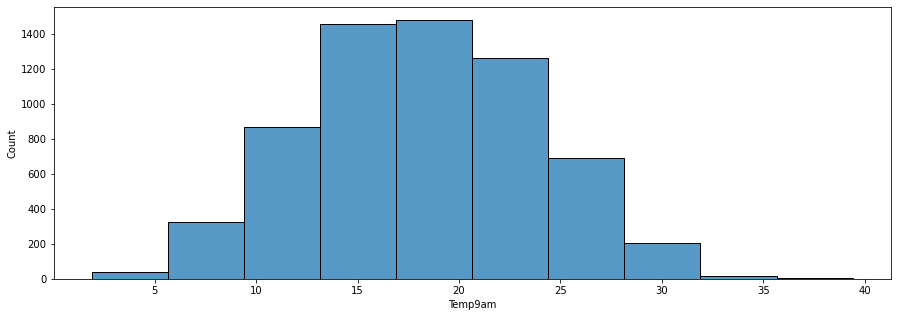

In [63]:
#Histplot for "Temp9amTemp9am" column
print(weather["Temp9am"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Temp9am',data=weather,bins=10)

14.8 (degrees C) is the highest Temperature at 9am

21.7    62
19.2    58
22.5    57
18.5    54
21.3    54
        ..
36.7     1
37.4     1
38.8     1
8.6      1
42.4     1
Name: Temp3pm, Length: 322, dtype: int64


<AxesSubplot:xlabel='Temp3pm', ylabel='Count'>

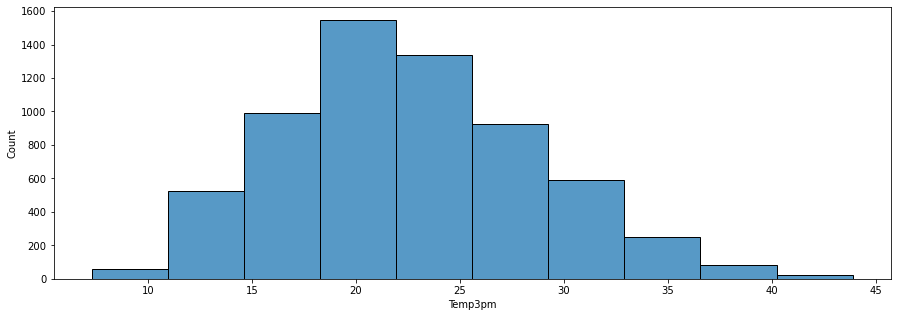

In [64]:
#Histplot for "Temp3pm" column
print(weather["Temp3pm"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Temp3pm',data=weather,bins=10)

21.7 (degrees C) is the highest Temperature at 3pm

24    221
25    217
21    215
20    214
3     213
15    212
17    212
18    212
10    211
16    210
19    210
9     209
2     209
14    207
6     207
23    207
28    206
4     205
11    204
13    204
5     204
12    203
27    202
7     202
22    201
8     200
26    199
1     199
29    195
30    192
31    130
Name: Day, dtype: int64


<AxesSubplot:xlabel='Day', ylabel='Count'>

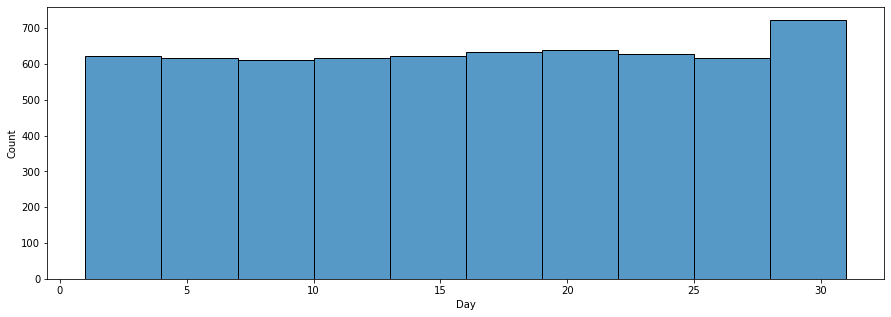

In [65]:
#Histplot for "Day" column
print(weather["Day"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Day',data=weather,bins=10)

Highest Observered on day 24

1     615
5     612
3     609
6     593
12    553
7     510
11    487
10    485
2     483
8     476
4     465
9     444
Name: Month, dtype: int64


<AxesSubplot:xlabel='Month', ylabel='Count'>

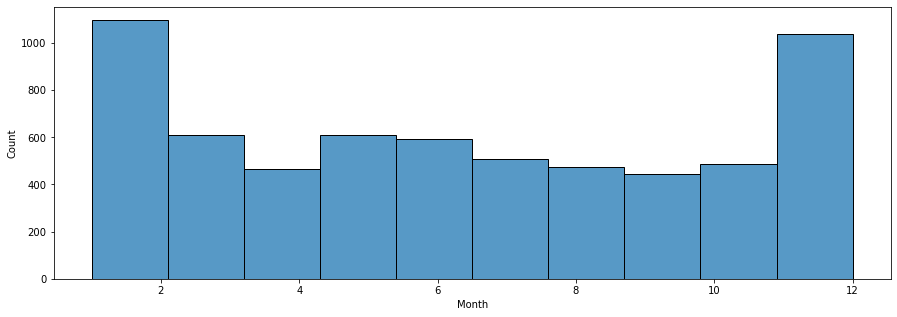

In [66]:
#Histplot for "Month" column
print(weather["Month"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Month',data=weather,bins=10)

Highest Observered in Month is 1st that is January

2010    1326
2011    1214
2009    1100
2012     857
2016     596
2017     364
2014     347
2013     324
2015     120
2008      84
Name: Year, dtype: int64


<AxesSubplot:xlabel='Year', ylabel='Count'>

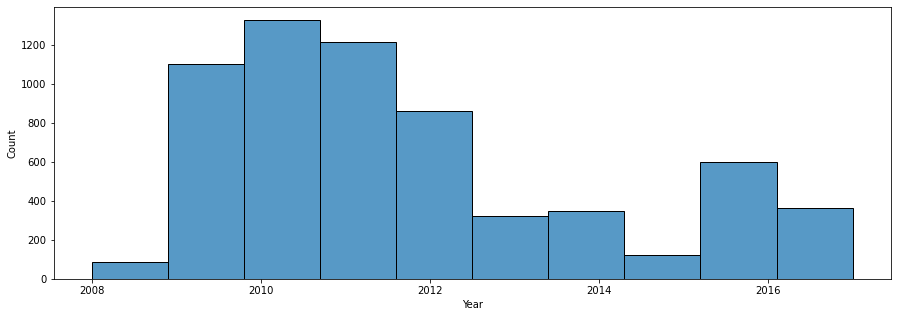

In [67]:
#Histplot for "Year" column
print(weather["Year"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Year',data=weather,bins=10)

Highest Observered in Year 2010

## Bivariate Analysis

<AxesSubplot:xlabel='Location', ylabel='Rainfall'>

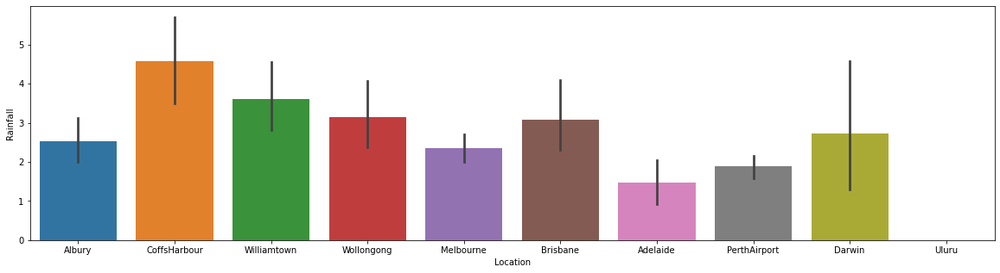

In [68]:
#Count Plot for comparision between "Location" column and "Rainfall" column
plt.figure(figsize=(20,5))
sns.barplot("Location",data=weather, y='Rainfall')

'CoffsHarbour' is the location where Rainfall is most and No Rainfall in Uluru

<AxesSubplot:xlabel='Location', ylabel='count'>

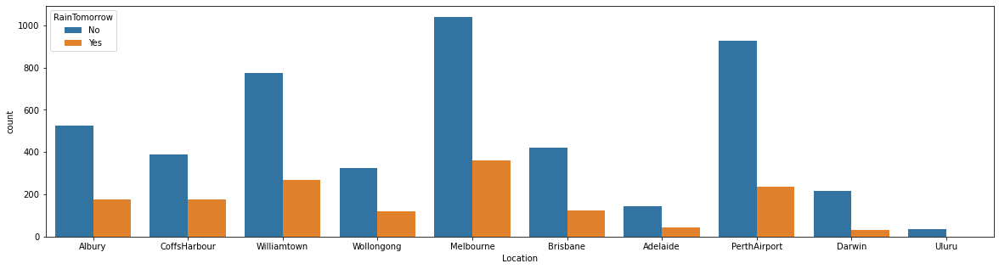

In [69]:
#Count Plot for comparision between "Location" column and "Rainfall" column
plt.figure(figsize=(20,5))
sns.countplot("Location",data=weather, hue='RainTomorrow')

- No RainTomorrow is most in all location but 'Melbourne' Location is having highest among all location for No RainTomorrow.

<AxesSubplot:xlabel='Location', ylabel='Rainfall'>

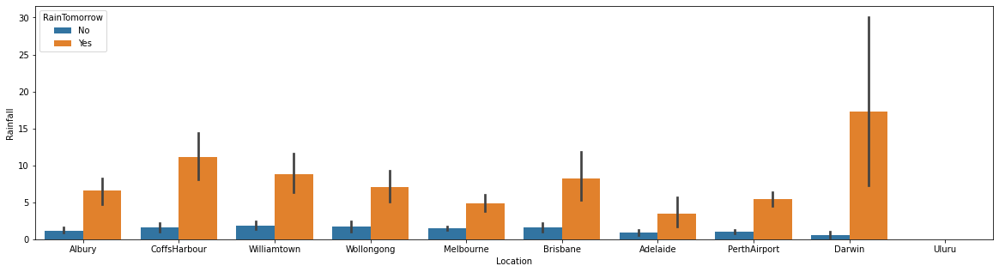

In [70]:
plt.figure(figsize=(20,5))
sns.barplot("Location",data=weather, y='Rainfall', hue='RainTomorrow')

At 'Darwin' Location there is RainTomorrow having approx 20mm Rainfall and no prediction for Uluru whether it Rain Tommorow or not. 

<AxesSubplot:xlabel='WindGustDir', ylabel='Rainfall'>

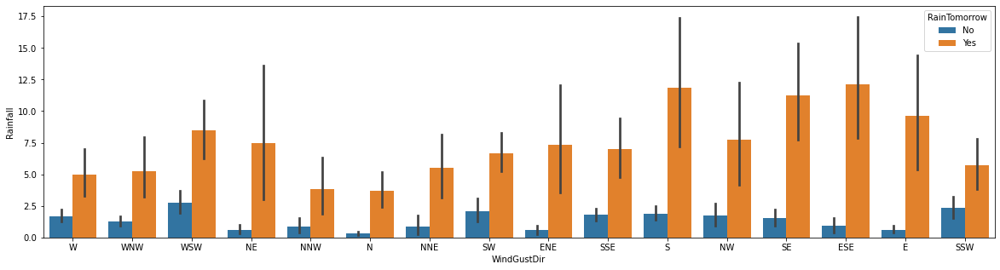

In [71]:
plt.figure(figsize=(20,5))
sns.barplot("WindGustDir",data=weather, y='Rainfall', hue='RainTomorrow')

"ESE" and "S" WindGustDir is having highest RainTomorrow with approx 12.5mm Rainfall.

<AxesSubplot:xlabel='WindDir9am', ylabel='Rainfall'>

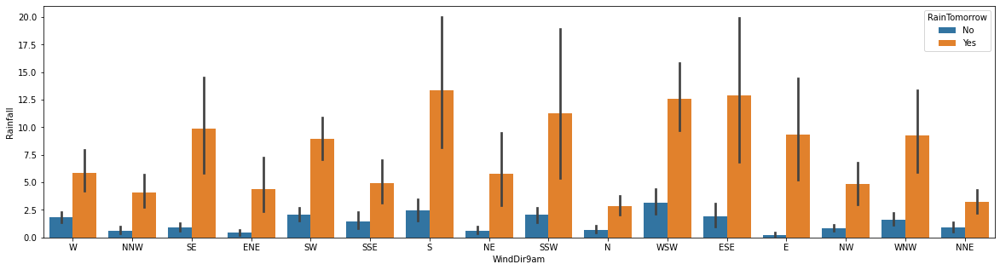

In [72]:
plt.figure(figsize=(20,5))
sns.barplot("WindDir9am",data=weather, y='Rainfall', hue='RainTomorrow')

There will be RainTomorrow in all wind direction at 9am having heavy Rainfall.

<AxesSubplot:xlabel='WindDir3pm', ylabel='Rainfall'>

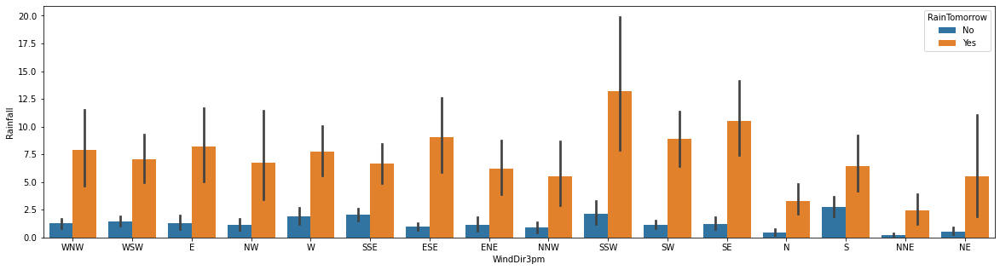

In [73]:
plt.figure(figsize=(20,5))
sns.barplot("WindDir3pm",data=weather, y='Rainfall', hue='RainTomorrow')

There will be RainTomorrow in all wind direction at 3pm having heavy Rainfall.

<AxesSubplot:xlabel='MinTemp', ylabel='Rainfall'>

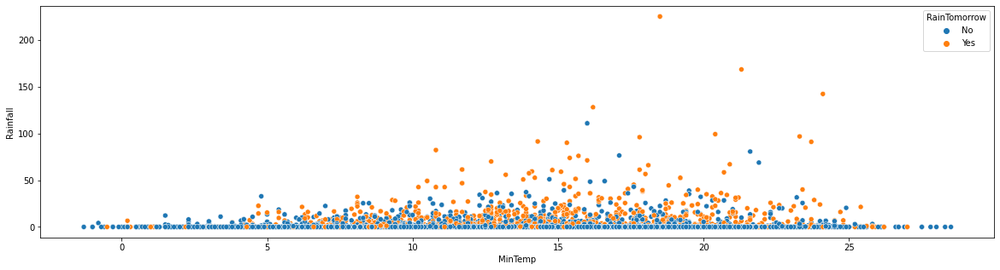

In [74]:
plt.figure(figsize=(20,5))
sns.scatterplot("MinTemp",data=weather, y='Rainfall', hue='RainTomorrow')

Min Temperature 18 is having heavy Rainfall Tomorrow. With increase in Min Temperature, Rainfall amount is also increasing with highest possibily of having Rain Tomorrow.

<AxesSubplot:xlabel='MaxTemp', ylabel='Rainfall'>

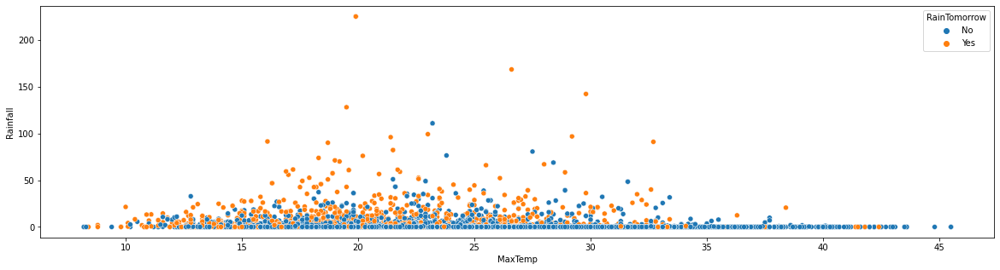

In [75]:
plt.figure(figsize=(20,5))
sns.scatterplot("MaxTemp",data=weather, y='Rainfall', hue='RainTomorrow')

With increase in Max Temperature, Rainfall amount is decreasing and with less Max Temperatur  highest possibily of having heavy Rain Tomorrow.

<AxesSubplot:xlabel='Evaporation', ylabel='Rainfall'>

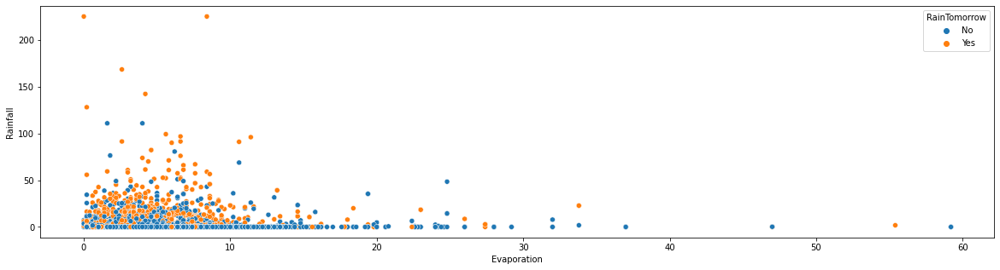

In [76]:
plt.figure(figsize=(20,5))
sns.scatterplot("Evaporation",data=weather, y='Rainfall', hue='RainTomorrow')

Less Evaporation heavy Rainfall Tomorrow, High Evaporation less or no Rainfall Tomorrow

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

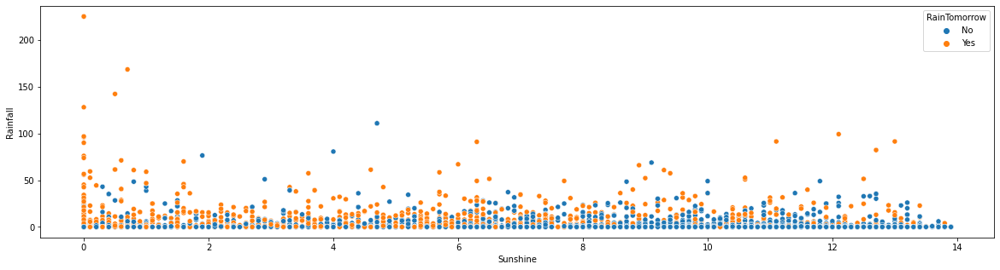

In [77]:
plt.figure(figsize=(20,5))
sns.scatterplot("Sunshine",data=weather, y='Rainfall', hue='RainTomorrow')

If Sunshine is less then Heavy Rainfall will be Tomorrow, and If Sunshine is hogh then less Rainfall will be Tomorrow.

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Rainfall'>

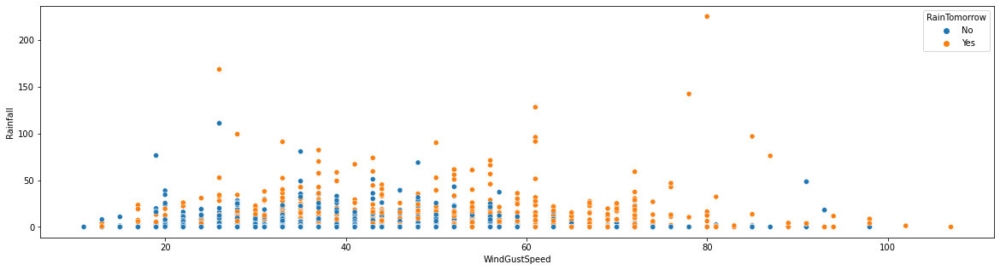

In [78]:
plt.figure(figsize=(20,5))
sns.scatterplot("WindGustSpeed",data=weather, y='Rainfall', hue='RainTomorrow')

High Wind Gust Speed, Heavy Rainfall Tomorrow and low  Wind Gust Speed low Rainfall Tomorrow.

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Rainfall'>

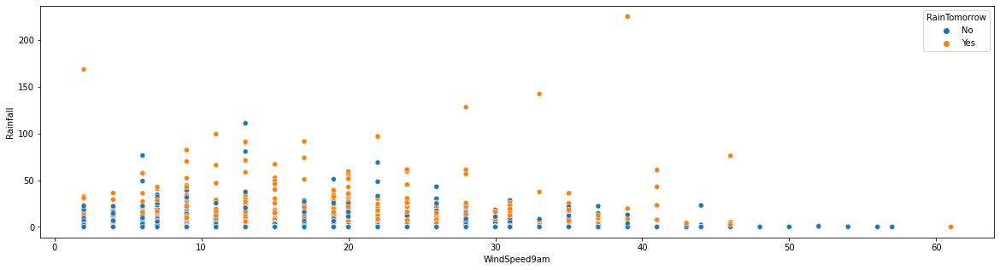

In [79]:
plt.figure(figsize=(20,5))
sns.scatterplot("WindSpeed9am",data=weather, y='Rainfall', hue='RainTomorrow')

At 9AM low Wind Speed Heavy Rainfall, as Wind Speed increases Rainfall decreases Tomorrow.

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Rainfall'>

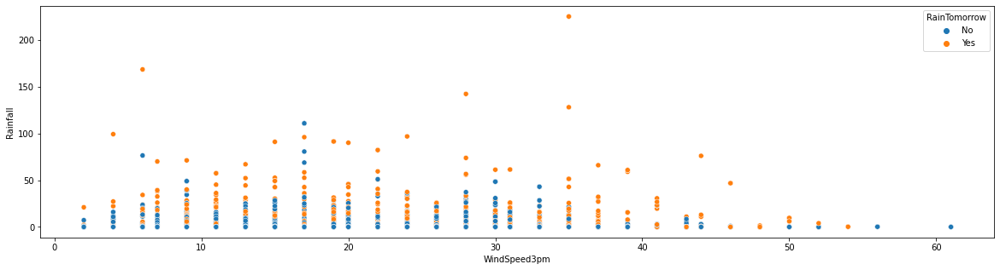

In [80]:
plt.figure(figsize=(20,5))
sns.scatterplot("WindSpeed3pm",data=weather, y='Rainfall', hue='RainTomorrow')

At 3 PM low Wind Speed Heavy Rainfall, as Wind Speed increases Rainfall decreases Tomorrow.

<AxesSubplot:xlabel='Humidity9am', ylabel='Rainfall'>

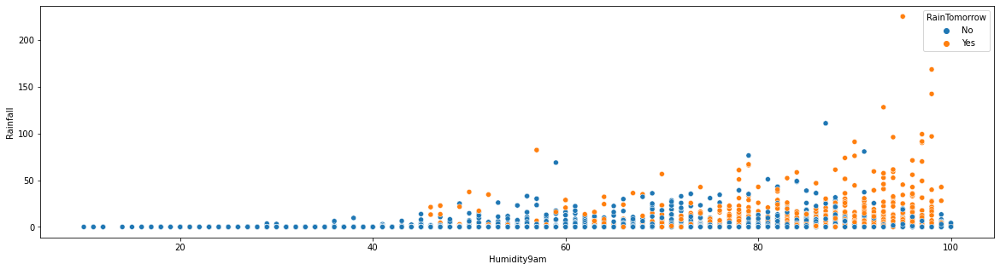

In [81]:
plt.figure(figsize=(20,5))
sns.scatterplot("Humidity9am",data=weather, y='Rainfall', hue='RainTomorrow')

At 9 AM, as humidity increases Rainfall will increase Tomorrow. Low Humidity No Rainfall, High Humidity Heavy Rainfall

<AxesSubplot:xlabel='Humidity3pm', ylabel='Rainfall'>

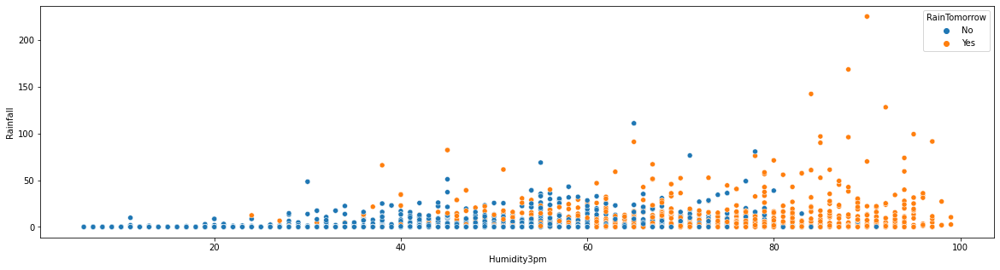

In [82]:
plt.figure(figsize=(20,5))
sns.scatterplot("Humidity3pm",data=weather, y='Rainfall', hue='RainTomorrow')

At 3 PM, as humidity increases Rainfall will increase Tomorrow. Low Humidity No Rainfall, High Humidity Heavy Rainfall

<AxesSubplot:xlabel='Pressure9am', ylabel='Rainfall'>

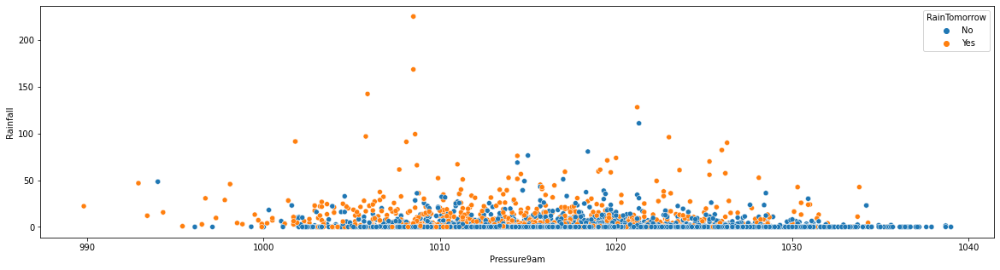

In [83]:
plt.figure(figsize=(20,5))
sns.scatterplot("Pressure9am",data=weather, y='Rainfall', hue='RainTomorrow')

At 9 AM there will be Heavy Rainfall Tomorrow

<AxesSubplot:xlabel='Pressure3pm', ylabel='Rainfall'>

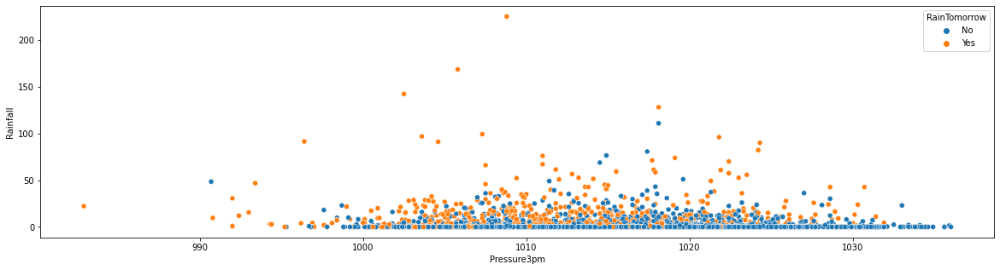

In [84]:
plt.figure(figsize=(20,5))
sns.scatterplot("Pressure3pm",data=weather, y='Rainfall', hue='RainTomorrow')

At 3PM there will be Heavy Rainfall Tomorrow

<AxesSubplot:xlabel='Cloud9am', ylabel='Rainfall'>

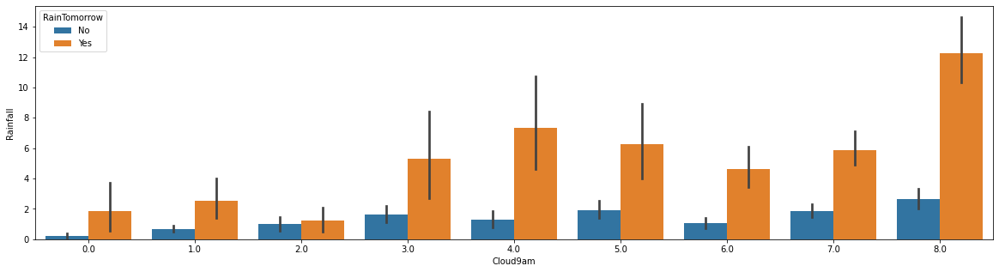

In [85]:
plt.figure(figsize=(20,5))
sns.barplot("Cloud9am",data=weather, y='Rainfall', hue='RainTomorrow')

At 9 AM there will be Heavy Rainfall Tomorrow

<AxesSubplot:xlabel='Cloud3pm', ylabel='Rainfall'>

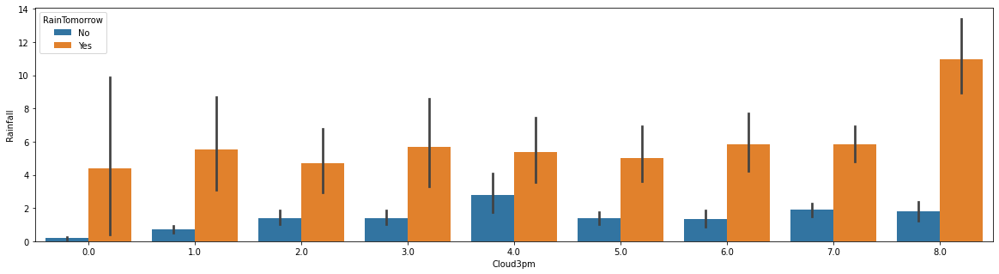

In [86]:
plt.figure(figsize=(20,5))
sns.barplot("Cloud3pm",data=weather, y='Rainfall', hue='RainTomorrow')

At 3 PM there will be Heavy Rainfall Tomorrow 

<AxesSubplot:xlabel='Temp9am', ylabel='Rainfall'>

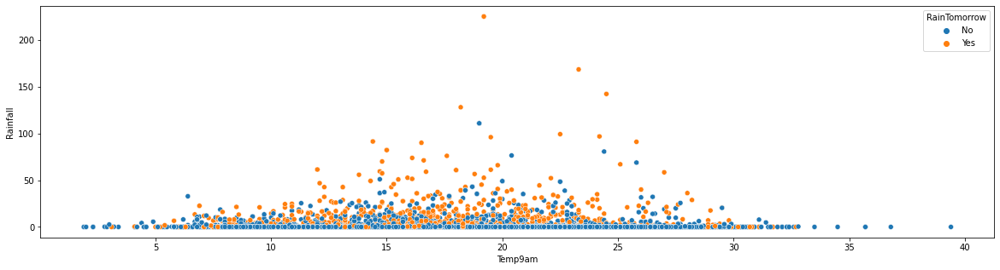

In [87]:
plt.figure(figsize=(20,5))
sns.scatterplot("Temp9am",data=weather, y='Rainfall', hue='RainTomorrow')

In between Temperature 5 to 30 at 9AM there will be heavy Rainfall Tomorrow.

<AxesSubplot:xlabel='Temp3pm', ylabel='Rainfall'>

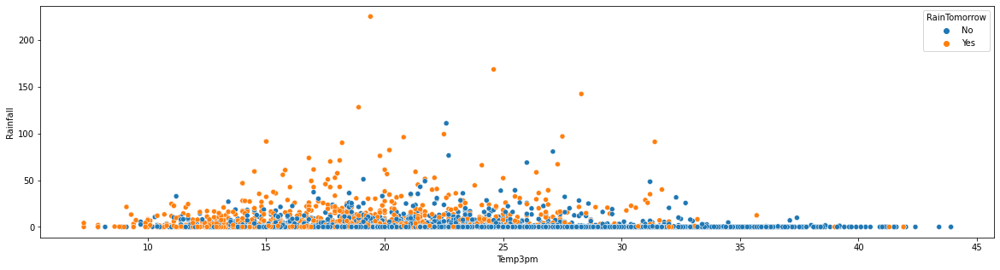

In [88]:
plt.figure(figsize=(20,5))
sns.scatterplot("Temp3pm",data=weather, y='Rainfall', hue='RainTomorrow')

At low Temperature Heavy Rainfall will be Tomorrow but with Increased Temperature there will be No Rain Tomorrow at 3PM

<AxesSubplot:xlabel='RainToday', ylabel='Rainfall'>

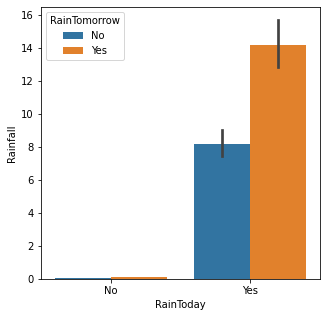

In [89]:
plt.figure(figsize=(5,5))
sns.barplot("RainToday",data=weather, y='Rainfall', hue='RainTomorrow')

Today is also Rainining heavily and will also Tomorrow.

## Multivariate Analysis
### Using Pairplot

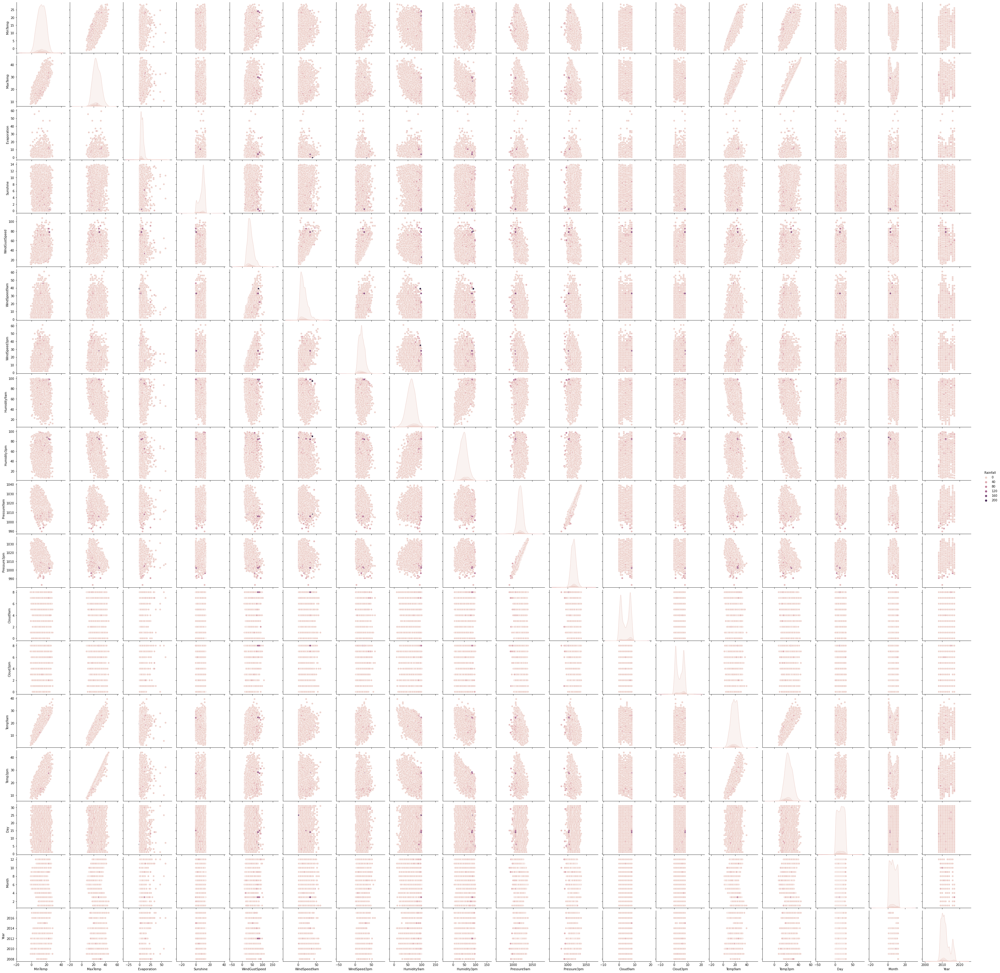

In [90]:
sns.pairplot(weather,hue="Rainfall")

We can observe relationship between all the continuous column and the target column by this pairplot in pairs which are plotted on basis of target column "Rainfall".

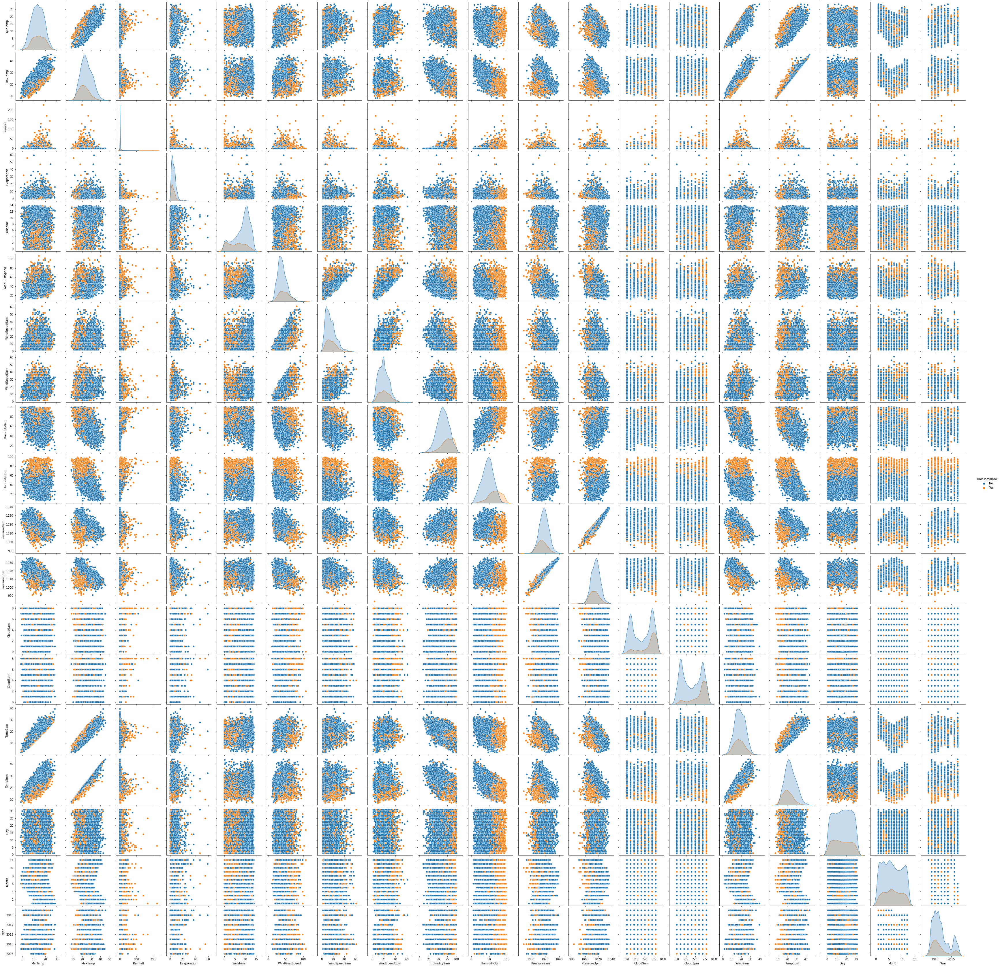

In [91]:
sns.pairplot(weather,hue="RainTomorrow")

We can observe relationship between all the continuous column and the target column by this pairplot in pairs which are plotted on basis of target column "RainTomorrow".

# Label Encoding

In [92]:
enc = LabelEncoder()
for i in weather.columns:
    if weather[i].dtypes=="object":
        weather[i]=enc.fit_transform(weather[i].values.reshape(-1,1))

#### Checking datatype after transformation

In [93]:
weather.dtypes

Location           int32
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir        int32
WindGustSpeed    float64
WindDir9am         int32
WindDir3pm         int32
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday          int32
RainTomorrow       int32
Day                int64
Month              int64
Year               int64
dtype: object

##### Checking dataset after transformation

In [94]:
weather.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.6,3.0,13.8,13,44.0,13,14,...,1007.1,8.0,8.0,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,0.0,2.2,7.6,14,44.0,6,15,...,1007.8,1.0,4.0,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,0.0,4.6,7.7,15,46.0,13,15,...,1008.7,2.0,2.0,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,0.0,1.8,8.0,4,24.0,9,0,...,1012.8,8.0,7.0,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,1.0,3.8,11.9,13,41.0,1,7,...,1006.0,7.0,8.0,17.8,29.7,0,0,5,12,2008


# Checking Correlation

In [95]:
weather.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
Location,1.000000,0.098892,0.008683,0.009523,0.112325,0.019053,-0.021226,0.253474,-0.039494,-0.031378,...,0.028993,0.057495,0.044727,0.067779,0.004430,0.002536,0.000425,-0.005054,-0.129302,0.412279
MinTemp,0.098892,1.000000,0.720152,0.081437,0.290079,0.053726,-0.184151,0.183754,-0.108725,-0.158214,...,-0.441899,0.051778,0.019696,0.878485,0.689874,0.026659,0.068984,-0.001097,-0.284046,0.043017
MaxTemp,0.008683,0.720152,1.000000,-0.109937,0.353733,0.318921,-0.265820,0.096041,-0.266690,-0.173319,...,-0.415039,-0.259048,-0.244648,0.878400,0.978900,-0.261690,-0.186393,0.011793,-0.198211,0.125208
Rainfall,0.009523,0.081437,-0.109937,1.000000,-0.032839,-0.155997,0.059931,0.098853,0.108790,0.047049,...,-0.050601,0.178058,0.152169,-0.029746,-0.111771,0.501989,0.261826,-0.029992,-0.024684,0.011411
Evaporation,0.112325,0.290079,0.353733,-0.032839,1.000000,0.195468,-0.077063,0.157281,-0.074588,-0.050458,...,-0.202903,-0.064056,-0.105771,0.340496,0.345099,-0.113485,-0.069393,0.007612,-0.008466,0.141717
Sunshine,0.019053,0.053726,0.318921,-0.155997,0.195468,1.000000,-0.084616,-0.020414,-0.072140,-0.051934,...,-0.037355,-0.416034,-0.402579,0.219549,0.333579,-0.209853,-0.304489,-0.001134,-0.000598,0.071855
WindGustDir,-0.021226,-0.184151,-0.265820,0.059931,-0.077063,-0.084616,1.000000,-0.011951,0.437480,0.563078,...,-0.030203,0.123832,0.098898,-0.217435,-0.279599,0.156462,0.060887,0.016592,0.060498,0.003103
WindGustSpeed,0.253474,0.183754,0.096041,0.098853,0.157281,-0.020414,-0.011951,1.000000,-0.148029,0.064923,...,-0.373182,0.023478,0.091114,0.138739,0.057405,0.087769,0.213994,-0.001344,0.033058,-0.027334
WindDir9am,-0.039494,-0.108725,-0.266690,0.108790,-0.074588,-0.072140,0.437480,-0.148029,1.000000,0.272433,...,0.105566,0.100012,0.070546,-0.185197,-0.271712,0.178683,0.029477,-0.006135,0.008651,0.016534
WindDir3pm,-0.031378,-0.158214,-0.173319,0.047049,-0.050458,-0.051934,0.563078,0.064923,0.272433,1.000000,...,-0.051100,0.078946,0.055703,-0.172293,-0.186611,0.106279,0.006581,0.003621,0.051910,-0.000209


This gives the correlation between the denpendent and independent variables.

In [96]:
weather.corr()["Rainfall"].sort_values()

Sunshine        -0.155997
Temp3pm         -0.111771
MaxTemp         -0.109937
Pressure9am     -0.096913
Pressure3pm     -0.050601
Evaporation     -0.032839
Day             -0.029992
Temp9am         -0.029746
Month           -0.024684
Location         0.009523
Year             0.011411
WindSpeed3pm     0.037545
WindDir3pm       0.047049
WindSpeed9am     0.056768
WindGustDir      0.059931
MinTemp          0.081437
WindGustSpeed    0.098853
WindDir9am       0.108790
Cloud3pm         0.152169
Cloud9am         0.178058
RainTomorrow     0.261826
Humidity3pm      0.264113
Humidity9am      0.279142
RainToday        0.501989
Rainfall         1.000000
Name: Rainfall, dtype: float64

#### We can observe:
- All columns are sorted in ascending order showing least to strong correlation with target column.
- 9 columns are negatively correlated and 15 columns are positively correlated.
- Column "RainToday" is highly positively correlated  with Target column "Rainfall"  and column "Sunshine" is highly negatively correlated

In [97]:
weather.corr()["RainTomorrow"].sort_values()

Sunshine        -0.304489
Temp3pm         -0.227838
MaxTemp         -0.186393
Pressure9am     -0.183962
Pressure3pm     -0.151541
Evaporation     -0.069393
Temp9am         -0.055935
Day             -0.027200
Year            -0.025105
Location         0.000425
WindDir3pm       0.006581
Month            0.020435
WindDir9am       0.029477
WindGustDir      0.060887
MinTemp          0.068984
WindSpeed3pm     0.078873
WindSpeed9am     0.079605
WindGustSpeed    0.213994
Rainfall         0.261826
Cloud9am         0.262772
Humidity9am      0.306375
Cloud3pm         0.325246
RainToday        0.339071
Humidity3pm      0.473290
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

#### We can observe:
- All columns are sorted in ascending order showing least to strong correlation with target column.
- 9 columns are negatively correlated and 15 columns are positively correlated.
- Column "Humidity3pm" is highly positively correlated  with Target column "RainTomorrow"  and column "Sunshine" is highly negatively correlated

## Checking correlation with heatmap

<AxesSubplot:>

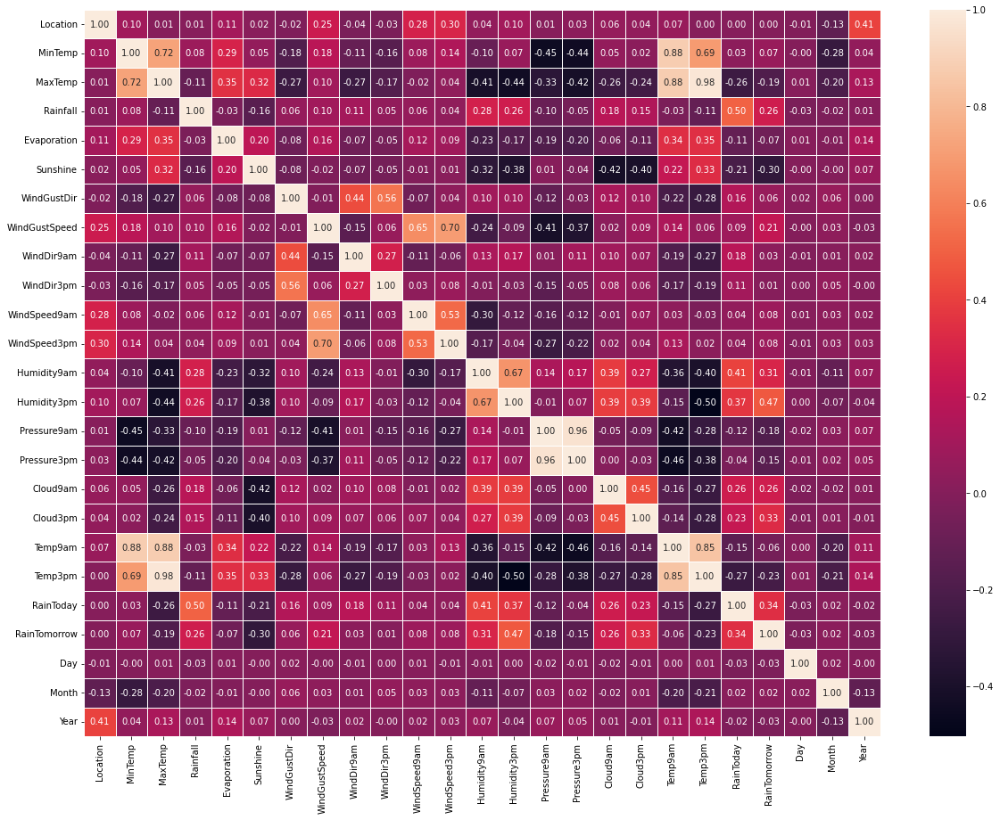

In [98]:
plt.figure(figsize=(20,15))
sns.heatmap(weather.corr(),annot=True, linewidth=0.5, linecolor='white', fmt='.2f')

### Outcome of Correlation for Target Variable Rainfall
- Location has 1 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- MinTemp has 8 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- MaxTemp has -11 percent correlation with the target column which can be considered as good correlation and negatively correlated. 
- Evaporation has -3 percent correlation with the target column which can be considered as good correlation and negatively correlated. 
- Sunshine has -16 percent correlation with the target column which can be considered as weak correlation and negatively correlated. 
- WindGustDir has 6 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- WindGustSpeed has 10 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- WindDir9am has 11 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- WindDir3pm has 5 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- WindSpeed9am has 6 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- WindSpeed3pm has 4 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- Humidity9am has 28 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- Humidity3pm has 26 percent correlation with the target column which can be considered as good correlation and positively correlated.  
- Pressure9am has -10 percent correlation with the target column which can be considered as good correlation and negatively correlated.
- Pressure3pm has -5 percent correlation with the target column which can be considered as good correlation and negatively correlated.
- Cloud9am has 18 percent correlation with the target column which can be considered as good correlation and positively correlated.
- Cloud3pm has 15 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- Temp9am has -3 percent correlation with the target column which can be considered as good correlation and negatively correlated. 
- Temp3pm has -11 percent correlation with the target column which can be considered as good correlation and negatively correlated.
- RainToday has 50 percent correlation with the target column which can be considered as strong correlation and positively correlated. 
- RainTomorrow has 26 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- Day has -3 percent correlation with the target column which can be considered as good correlation and negatively correlated.
- Month has -2 percent correlation with the target column which can be considered as good correlation and negatively correlated. 
- Year has 1 percent correlation with the target column which can be considered as good correlation and positively correlated. 


 - Max correlation is with RainToday 
 - Min correlation is with Sunshine

### Outcome of Correlation for Target Variable RainTomorrow
- Location has 0 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- MinTemp has 7 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- MaxTemp has -19 percent correlation with the target column which can be considered as good correlation and negatively correlated. 
- Rainfall has -26 percent correlation with the target column which can be considered as good correlation and negatively correlated. 
- Evaporation has -7 percent correlation with the target column which can be considered as good correlation and negatively correlated. 
- Sunshine has -30 percent correlation with the target column which can be considered as weak correlation and negatively correlated. 
- WindGustDir has 6 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- WindGustSpeed has 21 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- WindDir9am has 3 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- WindDir3pm has 1 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- WindSpeed9am has 8 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- WindSpeed3pm has 8 percent correlation with the target column which can be considered as strong correlation and positively correlated. 
- Humidity9am has 31 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- Humidity3pm has 47 percent correlation with the target column which can be considered as good correlation and positively correlated.  
- Pressure9am has -18 percent correlation with the target column which can be considered as good correlation and negatively correlated.
- Pressure3pm has -15 percent correlation with the target column which can be considered as good correlation and negatively correlated.
- Cloud9am has 26 percent correlation with the target column which can be considered as good correlation and positively correlated.
- Cloud3pm has 33 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- Temp9am has -6 percent correlation with the target column which can be considered as good correlation and negatively correlated. 
- Temp3pm has -23 percent correlation with the target column which can be considered as good correlation and negatively correlated.
- RainToday has 34 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- RainTomorrow has 1 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- Day has -3 percent correlation with the target column which can be considered as good correlation and negatively correlated.
- Month has 2 percent correlation with the target column which can be considered as good correlation and positively correlated. 
- Year has -3 percent correlation with the target column which can be considered as good correlation and negatively correlated. 


 - Max correlation is with Humidity3pm 
 - Min correlation is with Sunshine

## Checking correlation with barplot for Target Variable "Rainfall"

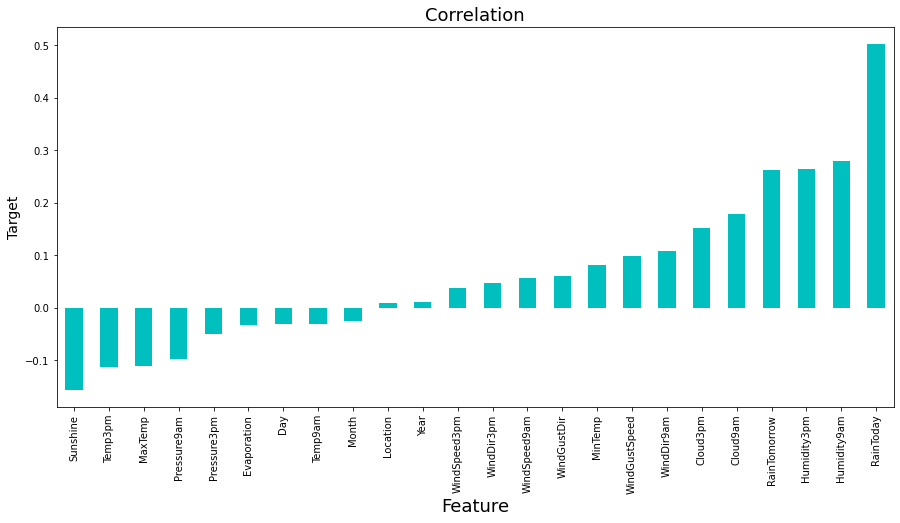

In [99]:
plt.figure(figsize=(15,7))
weather.corr()['Rainfall'].sort_values(ascending=True).drop(['Rainfall']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=18)
plt.ylabel('Target',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

### Observation:
- RainToday the highest positive correlation with Target column 'Rainfall' and Sunshine have the highest negative correlation with Target column 'Rainfall'.
- Least correlation with Location column

## Checking correlation with barplot for Target Variable "RainTomorrow"

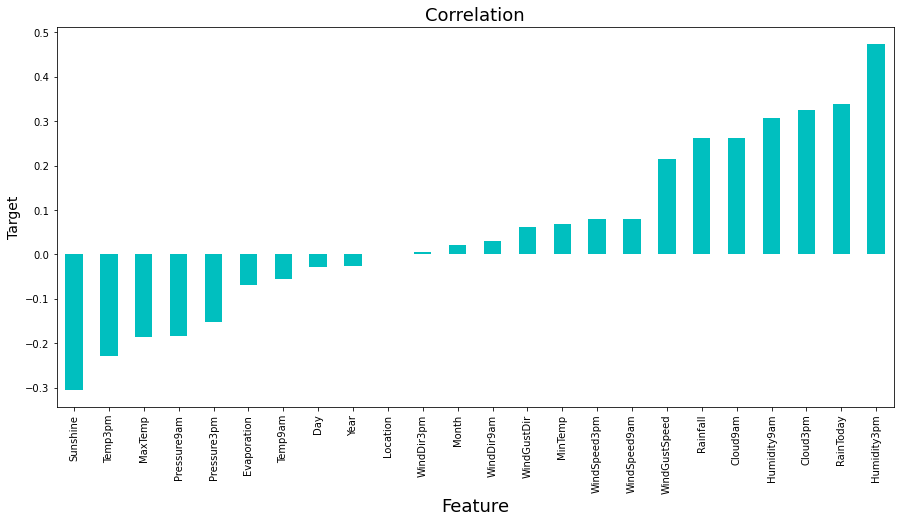

In [100]:
plt.figure(figsize=(15,7))
weather.corr()['RainTomorrow'].sort_values(ascending=True).drop(['RainTomorrow']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=18)
plt.ylabel('Target',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

### Observation: 
- Humidity3pm is the highest positive correlation with Target column 'RainTomorrow' and Sunshine have the highest negative correlation with Target column 'RainTomorrow'.
- No Correlation with Location. So we will drop this column.

In [101]:
weather.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

# Checking Outliers

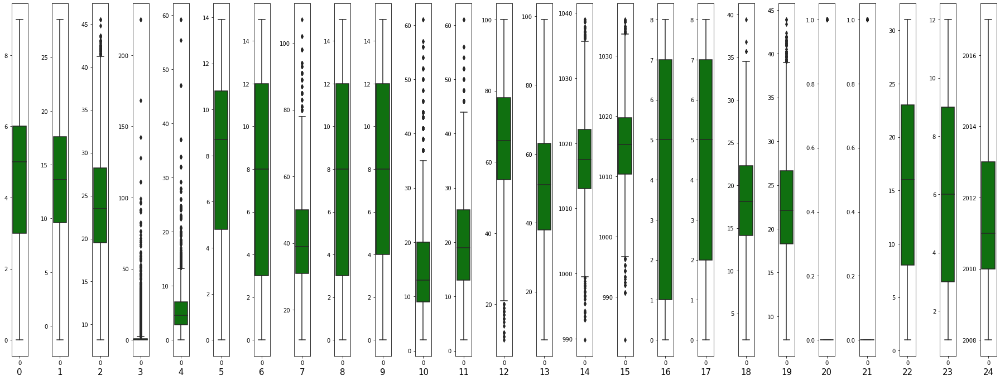

In [102]:
collist=weather.columns.values
ncol=25
nrows=8
plt.figure(figsize=(ncol,3*ncol))
for column in range(0,len(collist)):
    plt.subplot(nrows,ncol,column+1)
    sns.boxplot(data=weather[collist[column]],color='green',orient='v')
    plt.xlabel(column,fontsize = 15)
    plt.tight_layout()

### Outcome:
- __Outliers Present in columns:__ 'MaxTemp', 'Rainfall', 'Evaporation', 'WindGustSpeed','WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm','Temp9am','Temp3pm', 'RainToday', 'RainTomorrow'
- __Outliers not Present in columns:__ 'Location', 'MinTemp', 'Sunshine','WindGustDir',  'WindDir9am', 'WindDir3pm','Humidity3pm', 'Cloud9am', 'Cloud3pm', 'Day', 'Month', 'Year'

## Removing Outliers 
### 1.1 Zscore method using Scipy for Target Column "Rainfall"

In [103]:
#  Outliers will be removed only from Continuous column i.e; MaxTemp', 'Evaporation', 'WindGustSpeed','WindSpeed9am','WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm','Temp9am','Temp3pm'
# We will not remove outliers from Target column i.e; 'Rainfall' and from categorical column : 'RainToday', 'RainTomorrow'

variable = weather[['MaxTemp', 'Evaporation', 'WindGustSpeed','WindSpeed9am','WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm','Temp9am','Temp3pm']]

z=np.abs(zscore(variable))

# Creating new dataframe
weather_forecast = weather[(z<3).all(axis=1)]
weather_forecast.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.6,3.0,13.8,13,44.0,13,14,...,1007.1,8.0,8.0,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,0.0,2.2,7.6,14,44.0,6,15,...,1007.8,1.0,4.0,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,0.0,4.6,7.7,15,46.0,13,15,...,1008.7,2.0,2.0,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,0.0,1.8,8.0,4,24.0,9,0,...,1012.8,8.0,7.0,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,1.0,3.8,11.9,13,41.0,1,7,...,1006.0,7.0,8.0,17.8,29.7,0,0,5,12,2008


In [104]:
print("Old DataFrame data in Rows and Column:",weather.shape)
print("New DataFrame data in Rows and Column:",weather_forecast.shape)
print("Total Dropped rows:",weather.shape[0]-weather_forecast.shape[0])

Old DataFrame data in Rows and Column: (6332, 25)
New DataFrame data in Rows and Column: (6069, 25)
Total Dropped rows: 263


### Percentage Data Loss using Zscore

In [105]:
loss_percent=(6332-6069)/6332*100
print(loss_percent,"%")

4.153506001263424 %


### 1.2. IQR (Inter Quantile Range) method

In [106]:
#1st quantile
Q1=variable.quantile(0.25)

# 3rd quantile
Q3=variable.quantile(0.75)

#IQR
IQR=Q3 - Q1
weather_forecasting=weather[~((weather < (Q1 - 1.5 * IQR)) |(weather > (Q3 + 1.5 * IQR))).any(axis=1)]

In [107]:
print("Old DataFrame data in Rows and Column:",weather.shape)
print("\nNew DataFrame data in Rows and Column:",weather_forecasting.shape)
print("\nTotal Dropped rows:",weather.shape[0]-weather_forecasting.shape[0])

Old DataFrame data in Rows and Column: (6332, 25)

New DataFrame data in Rows and Column: (5743, 25)

Total Dropped rows: 589


### Percentage Data Loss using IQR

In [108]:
loss_perc = (6332-5743)/6332*100
loss_perc

9.301958307012002

We can check by using IQR method there is large data loss in comparision to Zscore method. So, we will consider Zscore method.

### 2.1 Zscore method using Scipy for Target Column "RainTomorrow"

In [109]:
#  Outliers will be removed only from Continuous column i.e; 'Rainfall', MaxTemp', 'Evaporation', 'WindGustSpeed','WindSpeed9am','WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm','Temp9am','Temp3pm'
# We will not remove outliers from Target column i.e; 'RainTomorrow' and from categorical column : 'RainToday'

variables = weather[['Rainfall', 'MaxTemp', 'Evaporation', 'WindGustSpeed','WindSpeed9am','WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm','Temp9am','Temp3pm']]

z1=np.abs(zscore(variables))

# Creating new dataframe
weather_forecast1 = weather[(z1<3).all(axis=1)]
weather_forecast1.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.6,3.0,13.8,13,44.0,13,14,...,1007.1,8.0,8.0,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,0.0,2.2,7.6,14,44.0,6,15,...,1007.8,1.0,4.0,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,0.0,4.6,7.7,15,46.0,13,15,...,1008.7,2.0,2.0,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,0.0,1.8,8.0,4,24.0,9,0,...,1012.8,8.0,7.0,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,1.0,3.8,11.9,13,41.0,1,7,...,1006.0,7.0,8.0,17.8,29.7,0,0,5,12,2008


In [110]:
print("Old DataFrame data in Rows and Column:",weather.shape)
print("New DataFrame data in Rows and Column:",weather_forecast1.shape)
print("Total Dropped rows:",weather.shape[0]-weather_forecast1.shape[0])

Old DataFrame data in Rows and Column: (6332, 25)
New DataFrame data in Rows and Column: (5972, 25)
Total Dropped rows: 360


### Percentage Data Loss using Zscore

In [111]:
loss_percent1=(6332-5972)/6332*100
print(loss_percent1,"%")

5.685407454200885 %


### 2.2. IQR (Inter Quantile Range) method

In [112]:
#1st quantile
Q1=variable.quantile(0.25)

# 3rd quantile
Q3=variable.quantile(0.75)

#IQR
IQR=Q3 - Q1
weather_forecasting1=weather[~((weather < (Q1 - 1.5 * IQR)) |(weather > (Q3 + 1.5 * IQR))).any(axis=1)]

In [113]:
print("Old DataFrame data in Rows and Column:",weather.shape)
print("\nNew DataFrame data in Rows and Column:",weather_forecasting1.shape)
print("\nTotal Dropped rows:",weather.shape[0]-weather_forecasting1.shape[0])

Old DataFrame data in Rows and Column: (6332, 25)

New DataFrame data in Rows and Column: (5743, 25)

Total Dropped rows: 589


### Percentage Data Loss using IQR

In [114]:
loss_perc = (6332-5743)/6332*100
loss_perc

9.301958307012002

We can check by using IQR method there is large data loss in comparision to Zscore method. So, we will consider Zscore method.

##### Now we have 2 Dataset for Target Column. So now we will drop column Location which have no relation with target Column 'RainTomorrow' from Dataset "weather_forecast1" 

In [115]:
weather_forecast1=weather_forecast1.drop(columns="Location", axis=1)

In [116]:
weather_forecast1.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,13.4,22.9,0.6,3.0,13.8,13,44.0,13,14,20.0,...,1007.1,8.0,8.0,16.9,21.8,0,0,1,12,2008
1,7.4,25.1,0.0,2.2,7.6,14,44.0,6,15,4.0,...,1007.8,1.0,4.0,17.2,24.3,0,0,2,12,2008
2,12.9,25.7,0.0,4.6,7.7,15,46.0,13,15,19.0,...,1008.7,2.0,2.0,21.0,23.2,0,0,3,12,2008
3,9.2,28.0,0.0,1.8,8.0,4,24.0,9,0,11.0,...,1012.8,8.0,7.0,18.1,26.5,0,0,4,12,2008
4,17.5,32.3,1.0,3.8,11.9,13,41.0,1,7,7.0,...,1006.0,7.0,8.0,17.8,29.7,0,0,5,12,2008


In [117]:
weather_forecast1.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

In [118]:
weather_forecast1.shape

(5972, 24)

# 1.1 Checking Skewness for 'Rainfall' Target column

In [119]:
#for Target variable 'Rainfall'
weather_forecast.skew()

Location        -0.147846
MinTemp         -0.028322
MaxTemp          0.295552
Rainfall         9.485499
Evaporation      0.810553
Sunshine        -0.554352
WindGustDir     -0.138363
WindGustSpeed    0.564304
WindDir9am      -0.053077
WindDir3pm      -0.100990
WindSpeed9am     0.795937
WindSpeed3pm     0.369203
Humidity9am     -0.190593
Humidity3pm      0.096377
Pressure9am      0.054527
Pressure3pm      0.083102
Cloud9am        -0.317702
Cloud3pm        -0.234391
Temp9am          0.007801
Temp3pm          0.312857
RainToday        1.177737
RainTomorrow     1.222694
Day             -0.003751
Month            0.096219
Year             0.852129
dtype: float64

### Observation:
- Skewness threshold taken is +/-0.25
- All the columns are not normallly distributed, they are skewed.
- Columns which are having skewness: MaxTemp,Rainfall, Evaporation,Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Cloud9am, Temp3pm, RainToday, RainTomorrow, Year. 
- The Sunshine column data is negatively highly skewed and Rainfall is positively highly skewed
- Since RainToday, RainTomorrow are categorical column so we will not remove skewness and Rainfall is Target Column so we will not remove skewness. 
- So we will remove skewness from MaxTemp, Evaporation,Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Cloud9am, Temp3pm, Year.

## 1.2 Checking skweness through Data Visualization also

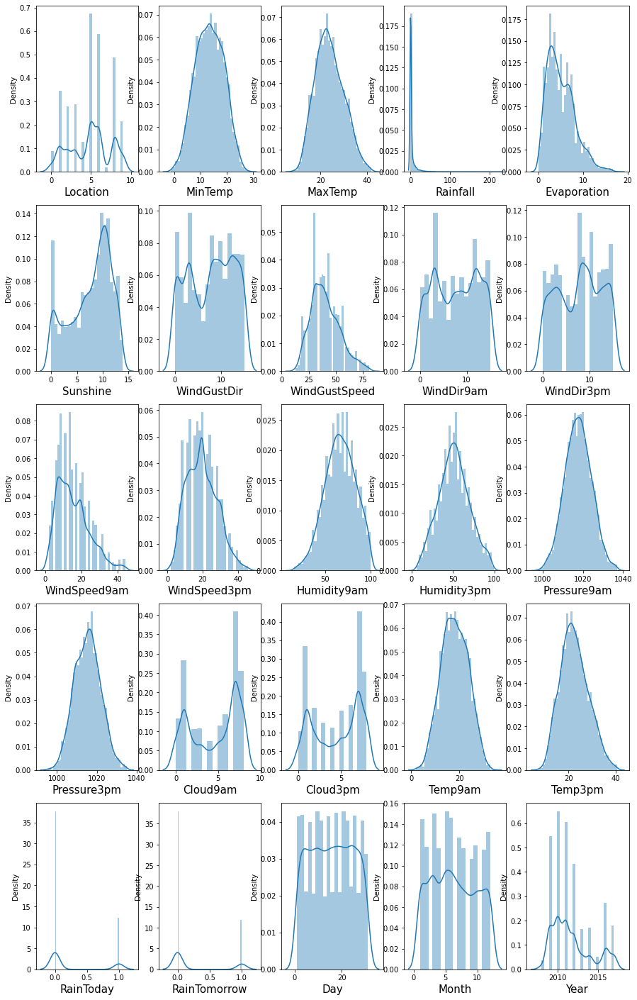

In [120]:
plt.figure(figsize=(15,25), facecolor='white')
plotnumber = 1

for column in weather_forecast:
    if plotnumber<=25:
        ax = plt.subplot(5,5,plotnumber)
        sns.distplot(weather_forecast[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

We can see all columns are highly skewed but we will remove skewness only from continuous columns

## 1.3 Removing skewness using yeo-johnson method

In [121]:
collist=['MaxTemp', 'Evaporation','Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Cloud9am', 'Temp3pm', 'Year']
weather_forecast[collist]=power_transform(weather_forecast[collist],method='yeo-johnson')
weather_forecast[collist]

,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Cloud9am,Temp3pm,Year
0,-0.105770,-0.579554,1.684961,0.374591,0.653941,0.570659,1.181970,-0.053140,0.0
1,0.253489,-0.958179,-0.085790,0.374591,-1.642300,0.355753,-1.265005,0.361910,0.0
2,0.348569,0.037528,-0.058918,0.513909,0.557823,0.778327,-0.893568,0.182103,0.0
3,0.702623,-1.173802,0.022081,-1.352921,-0.365335,-1.311305,1.181970,0.709464,0.0
4,1.325518,-0.252332,1.121871,0.156963,-1.000206,0.132694,0.847575,1.189602,0.0
...,...,...,...,...,...,...,...,...,...
6327,-0.292194,-0.252332,-0.784458,-0.661462,0.136405,-0.731655,-1.265005,-0.208442,0.0
6328,-0.022583,0.594110,-1.628198,-0.661462,-0.102092,-1.011098,1.181970,0.048592,0.0
6329,0.285313,1.969755,-0.219161,-1.576002,-0.102092,-1.311305,-1.265005,0.394153,0.0
6330,0.535286,-0.103368,1.445913,-0.151440,-0.660770,-1.311305,0.509582,0.647402,0.0


### 1.4 checking skewness again after removal

In [122]:
weather_forecast.skew()

Location        -0.147846
MinTemp         -0.028322
MaxTemp         -0.016272
Rainfall         9.485499
Evaporation     -0.025445
Sunshine        -0.400235
WindGustDir     -0.138363
WindGustSpeed   -0.009449
WindDir9am      -0.053077
WindDir3pm      -0.100990
WindSpeed9am    -0.030602
WindSpeed3pm    -0.046817
Humidity9am     -0.190593
Humidity3pm      0.096377
Pressure9am      0.054527
Pressure3pm      0.083102
Cloud9am        -0.352187
Cloud3pm        -0.234391
Temp9am          0.007801
Temp3pm         -0.014712
RainToday        1.177737
RainTomorrow     1.222694
Day             -0.003751
Month            0.096219
Year             0.000000
dtype: float64

Still we can see skewness is present but from earlier it is removed.

### 1.5 checking skewness after removal through data visualization using distplot

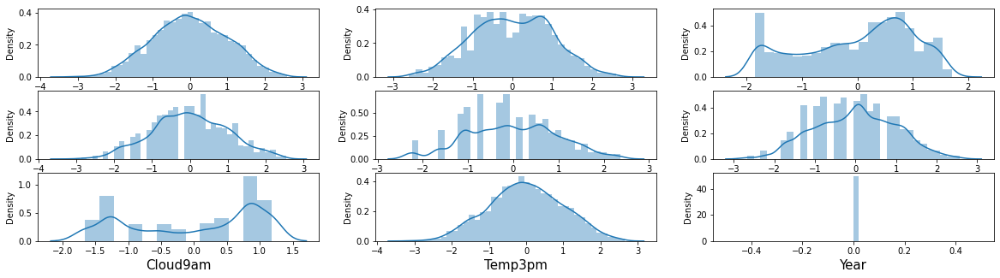

In [123]:
collist=['MaxTemp', 'Evaporation','Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Cloud9am', 'Temp3pm', 'Year']
plt.figure(figsize=(20,5), facecolor='white')
plotnumber = 1

for column in weather_forecast[collist]:
    if plotnumber<=9:
        ax = plt.subplot(3,3,plotnumber)
        sns.distplot(weather_forecast[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()


The data is not normal and the skewness is still present in some columns. But better than before.

## 2.1 Checking skewness of Target Column 'RainTomorrow'

In [124]:
#for Target variable 'RainTomorrow'
weather_forecast1.skew()

MinTemp         -0.016334
MaxTemp          0.287176
Rainfall         3.380703
Evaporation      0.813228
Sunshine        -0.567790
WindGustDir     -0.135031
WindGustSpeed    0.564964
WindDir9am      -0.044722
WindDir3pm      -0.096365
WindSpeed9am     0.795751
WindSpeed3pm     0.368919
Humidity9am     -0.189710
Humidity3pm      0.094337
Pressure9am      0.058711
Pressure3pm      0.085801
Cloud9am        -0.299513
Cloud3pm        -0.219096
Temp9am          0.006904
Temp3pm          0.304491
RainToday        1.256284
RainTomorrow     1.276275
Day             -0.010407
Month            0.090916
Year             0.850383
dtype: float64

### Observation:
- Skewness threshold taken is +/-0.25
- All the columns are not normallly distributed, they are skewed.
- Columns which are having skewness: MaxTemp,Rainfall, Evaporation,Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Cloud9am, Temp3pm, RainToday, RainTomorrow, Year. 
- The Sunshine column data is negatively highly skewed and Rainfall is positively highly skewed
- Since RainToday is categorical column and RainTomorrow is Target Column so we will not remove skewness. 
- So we will remove skewness from MaxTemp, Rainfall, Evaporation,Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Cloud9am, Temp3pm, Year.

## 2.2 Checking skweness through Data Visualization also

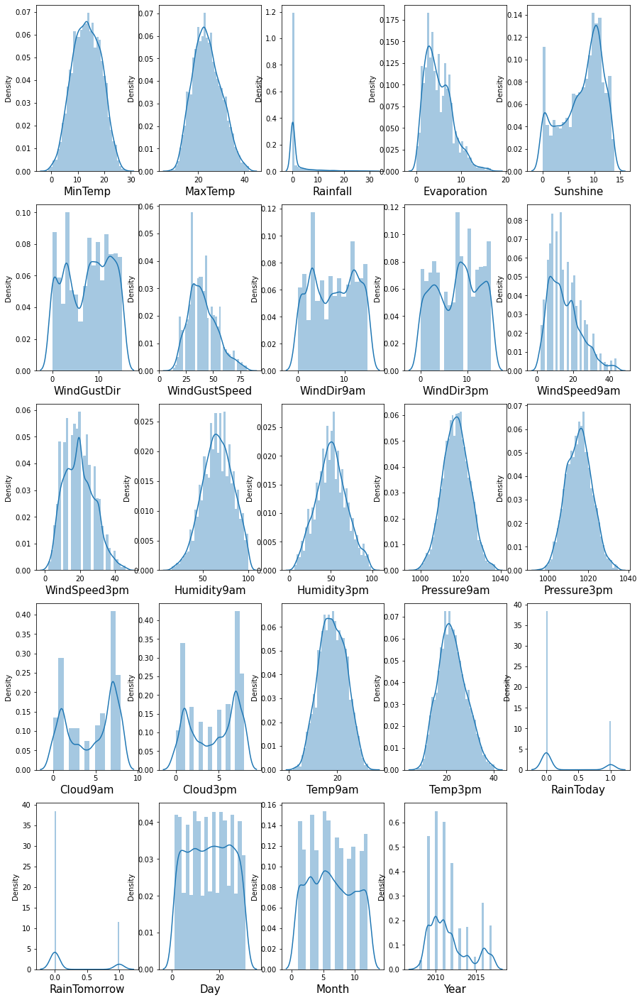

In [125]:
plt.figure(figsize=(15,25), facecolor='white')
plotnumber = 1

for column in weather_forecast1:
    if plotnumber<=24:
        ax = plt.subplot(5,5,plotnumber)
        sns.distplot(weather_forecast1[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

We can see all columns are highly skewed but we will remove skewness only from continuous columns

## 2.3 Removing skewness using yeo-johnson method

In [126]:
collist1=['MaxTemp', 'Rainfall', 'Evaporation','Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Cloud9am', 'Temp3pm', 'Year']
weather_forecast1[collist1]=power_transform(weather_forecast1[collist1],method='yeo-johnson')
weather_forecast1[collist1]

,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Cloud9am,Temp3pm,Year
0,-0.110802,0.748334,-0.578668,1.692983,0.381350,0.657236,0.571803,1.191363,-0.058764,0.0
1,0.247290,-0.653580,-0.958089,-0.102166,0.381350,-1.638995,0.356482,-1.252190,0.355176,0.0
2,0.342124,-0.653580,0.038873,-0.075070,0.520701,0.561202,0.779908,-0.875515,0.175789,0.0
3,0.695488,-0.653580,-1.174353,0.006639,-1.347513,-0.361488,-1.312310,1.191363,0.702173,0.0
4,1.318000,1.108766,-0.251078,1.120312,0.163648,-0.996438,0.133032,0.861286,1.182076,0.0
...,...,...,...,...,...,...,...,...,...,...
6327,-0.296468,-0.653580,-0.251078,-0.804356,-0.655297,0.140077,-0.732393,-1.252190,-0.213521,0.0
6328,-0.027919,-0.653580,0.595045,-1.643138,-0.655297,-0.098312,-1.012016,1.191363,0.042650,0.0
6329,0.279030,-0.653580,1.966693,-0.236563,-1.570904,-0.098312,-1.312310,-1.252190,0.387353,0.0
6330,0.528433,-0.653580,-0.102040,1.449694,-0.144904,-0.656916,-1.312310,0.526739,0.640186,0.0


## 2.4 checking skewness after removal

In [127]:
weather_forecast1.skew()

MinTemp         -0.016334
MaxTemp         -0.017183
Rainfall         1.028591
Evaporation     -0.025294
Sunshine        -0.399666
WindGustDir     -0.135031
WindGustSpeed   -0.009426
WindDir9am      -0.044722
WindDir3pm      -0.096365
WindSpeed9am    -0.030711
WindSpeed3pm    -0.046433
Humidity9am     -0.189710
Humidity3pm      0.094337
Pressure9am      0.058711
Pressure3pm      0.085801
Cloud9am        -0.343110
Cloud3pm        -0.219096
Temp9am          0.006904
Temp3pm         -0.015517
RainToday        1.256284
RainTomorrow     1.276275
Day             -0.010407
Month            0.090916
Year             0.000000
dtype: float64

## 2.5 checking skewness after removal through data visualization using distplot

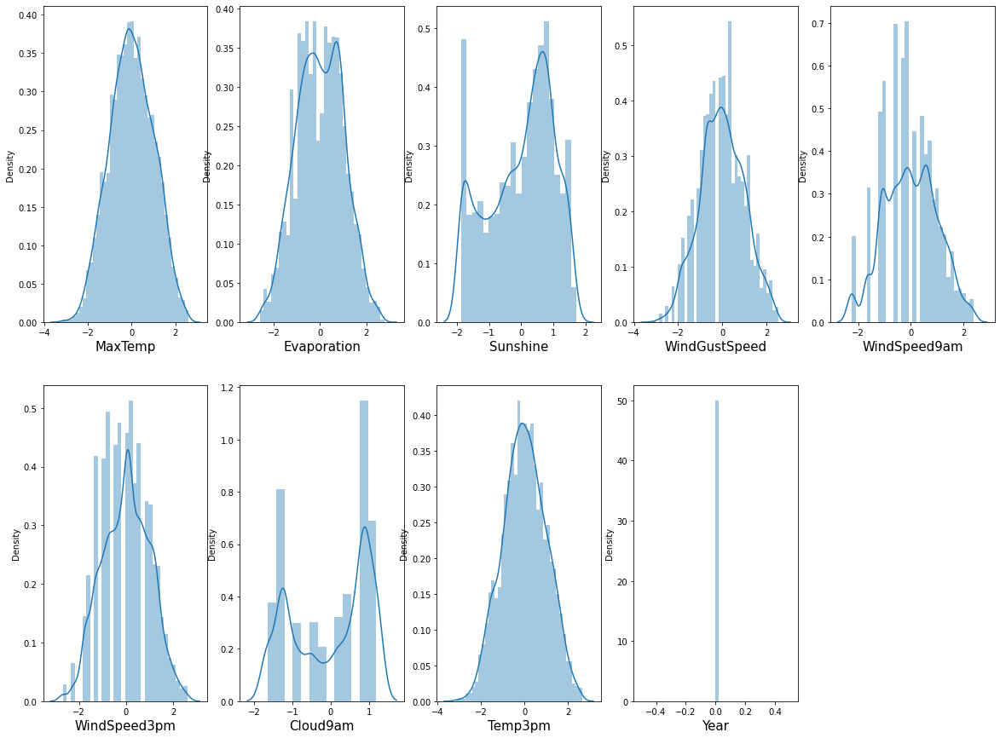

In [128]:
collist1=['MaxTemp', 'Rainfall', 'Evaporation','Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Cloud9am', 'Temp3pm', 'Year']
plt.figure(figsize=(20,15), facecolor='white')
plotnumber = 1

for column in weather_forecast1[collist]:
    if plotnumber<=10:
        ax = plt.subplot(2,5,plotnumber)
        sns.distplot(weather_forecast1[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

The data is not normal and the skewness is still present in some columns. But removed skewness from earlier.

# Data preprocessing

## Spliting data into Target and Features for Target  column "Rainfall" :

In [129]:
x=weather_forecast.drop("Rainfall",axis=1)
y=weather_forecast["Rainfall"]

In [130]:
x.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

In [131]:
x.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,-0.105770,-0.579554,1.684961,13,0.374591,13,14,0.653941,...,1007.1,1.181970,8.0,16.9,-0.053140,0,0,1,12,0.0
1,1,7.4,0.253489,-0.958179,-0.085790,14,0.374591,6,15,-1.642300,...,1007.8,-1.265005,4.0,17.2,0.361910,0,0,2,12,0.0
2,1,12.9,0.348569,0.037528,-0.058918,15,0.513909,13,15,0.557823,...,1008.7,-0.893568,2.0,21.0,0.182103,0,0,3,12,0.0
3,1,9.2,0.702623,-1.173802,0.022081,4,-1.352921,9,0,-0.365335,...,1012.8,1.181970,7.0,18.1,0.709464,0,0,4,12,0.0
4,1,17.5,1.325518,-0.252332,1.121871,13,0.156963,1,7,-1.000206,...,1006.0,0.847575,8.0,17.8,1.189602,0,0,5,12,0.0


In [132]:
y.head()

0    0.6
1    0.0
2    0.0
3    0.0
4    1.0
Name: Rainfall, dtype: float64

In [133]:
x.shape, y.shape

((6069, 24), (6069,))

## Spliting data into Target and Features for Target column "RainTomorrow" :

In [134]:
x1=weather_forecast1.drop("RainTomorrow",axis=1)
y1=weather_forecast1["RainTomorrow"]

In [135]:
x1.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'Day', 'Month', 'Year'],
      dtype='object')

In [136]:
x1.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,13.4,-0.110802,0.748334,-0.578668,1.692983,13,0.381350,13,14,0.657236,...,1007.7,1007.1,1.191363,8.0,16.9,-0.058764,0,1,12,0.0
1,7.4,0.247290,-0.653580,-0.958089,-0.102166,14,0.381350,6,15,-1.638995,...,1010.6,1007.8,-1.252190,4.0,17.2,0.355176,0,2,12,0.0
2,12.9,0.342124,-0.653580,0.038873,-0.075070,15,0.520701,13,15,0.561202,...,1007.6,1008.7,-0.875515,2.0,21.0,0.175789,0,3,12,0.0
3,9.2,0.695488,-0.653580,-1.174353,0.006639,4,-1.347513,9,0,-0.361488,...,1017.6,1012.8,1.191363,7.0,18.1,0.702173,0,4,12,0.0
4,17.5,1.318000,1.108766,-0.251078,1.120312,13,0.163648,1,7,-0.996438,...,1010.8,1006.0,0.861286,8.0,17.8,1.182076,0,5,12,0.0


In [137]:
y1.head()

0    0
1    0
2    0
3    0
4    0
Name: RainTomorrow, dtype: int32

In [138]:
x1.shape, y1.shape

((5972, 23), (5972,))

In [139]:
y1.value_counts()

0    4592
1    1380
Name: RainTomorrow, dtype: int64

The data is not balanced. So, we will use oversampling method to balance it.

## Oversampling using the SMOTE

In [140]:
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE

In [141]:
SM = SMOTE()
x1, y1 = SM.fit_resample(x1,y1)

In [142]:
y1.value_counts()

0    4592
1    4592
Name: RainTomorrow, dtype: int64

After using oversampling method, we check that now our data is balanced.

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

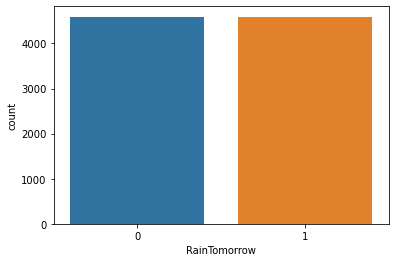

In [143]:
#checking through visualization also
sns.countplot(y1)

Now, our data is balanced.

# Scaling data using Standard Scaler

#### For Target Column "Rainfall"

In [144]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

In [145]:
x.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,-1.527803,-0.012437,-0.105770,-0.579554,1.684961,1.103165,0.374591,1.116075,1.334168,0.653941,...,-1.270685,1.181970,1.279428,-0.214259,-0.053140,-0.571706,-0.560794,-1.678397,1.646022,0.0
1,-1.527803,-1.146302,0.253489,-0.958179,-0.085790,1.313591,0.374591,-0.368496,1.549630,-1.642300,...,-1.162971,-1.265005,-0.188199,-0.159949,0.361910,-0.571706,-0.560794,-1.564772,1.646022,0.0
2,-1.527803,-0.106925,0.348569,0.037528,-0.058918,1.524016,0.513909,1.116075,1.549630,0.557823,...,-1.024481,-0.893568,-0.922013,0.527974,0.182103,-0.571706,-0.560794,-1.451146,1.646022,0.0
3,-1.527803,-0.806142,0.702623,-1.173802,0.022081,-0.790665,-1.352921,0.267749,-1.682302,-0.365335,...,-0.393583,1.181970,0.912521,0.002980,0.709464,-0.571706,-0.560794,-1.337520,1.646022,0.0
4,-1.527803,0.762371,1.325518,-0.252332,1.121871,1.103165,0.156963,-1.428903,-0.174067,-1.000206,...,-1.439950,0.847575,1.279428,-0.051330,1.189602,-0.571706,-0.560794,-1.223895,1.646022,0.0


#### For Target Column "RainTomorrow"

In [146]:
scaler = StandardScaler()
x1 = pd.DataFrame(scaler.fit_transform(x1), columns = x1.columns)

In [147]:
x1.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,-0.041304,0.018684,0.491918,-0.529517,1.935550,1.154052,0.251706,1.173773,1.401996,0.620661,...,-1.427280,-1.187790,1.096634,1.138328,-0.172291,0.100432,-0.61864,-1.661122,1.735492,0.0
1,-1.189341,0.378162,-0.837255,-0.927478,0.101258,1.373507,0.251706,-0.359209,1.624121,-1.800291,...,-0.983129,-1.079387,-1.508575,-0.413111,-0.117567,0.510752,-0.61864,-1.545929,1.735492,0.0
2,-0.136973,0.473363,-0.837255,0.118200,0.128945,1.592962,0.394479,1.173773,1.624121,0.519411,...,-1.442596,-0.940012,-1.106981,-1.188831,0.575611,0.332934,-0.61864,-1.430737,1.735492,0.0
3,-0.844930,0.828094,-0.837255,-1.154309,0.212436,-0.821045,-1.519609,0.297783,-1.707757,-0.453396,...,0.088960,-0.305080,1.096634,0.750468,0.046607,0.854714,-0.61864,-1.315545,1.735492,0.0
4,0.743189,1.453015,0.833649,-0.185919,1.350392,1.154052,0.028659,-1.454197,-0.152880,-1.122833,...,-0.952498,-1.358138,0.744720,1.138328,-0.008117,1.330420,-0.61864,-1.200352,1.735492,0.0


# Variance Threshold Method
It removes all features which variance doesn't meet some threshold. By default, it removes all zero-variance features.

### For Target Column "Rainfall"

In [148]:
var_threshold = VarianceThreshold(threshold=0)
var_threshold.fit(x)

VarianceThreshold(threshold=0)

In [149]:
var_threshold.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False])

In [150]:
x.columns[var_threshold.get_support()]

Index(['Location', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month'],
      dtype='object')

In [151]:
# taking  out  all the  constant  columns 
cons_columns = [column for column in x.columns
               if column not in x.columns[var_threshold.get_support()]]
print(len(cons_columns))

1


#### So we can see that, with the help of variance threshold method, we got to know that except 1 feature "Month" all other features are important. So we will drop that feature.

In [152]:
x = x.drop([ "Month"],axis=1)

In [153]:
x.shape

(6069, 23)

In [154]:
x.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Year'],
      dtype='object')

### For Target Column "RainTomorrow"

In [155]:
var_threshold = VarianceThreshold(threshold=0)
var_threshold.fit(x1)

VarianceThreshold(threshold=0)

In [156]:
var_threshold.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False])

In [157]:
x1.columns[var_threshold.get_support()]

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'Day', 'Month'],
      dtype='object')

In [158]:
# taking  out  all the  constant  columns 
cons_columns1 = [column for column in x1.columns
               if column not in x1.columns[var_threshold.get_support()]]
print(len(cons_columns))

1


#### So we can see that, with the help of variance threshold method, we got to know that except 1 feature "Month" all other features are important. So we will drop that "Month" feature.

In [159]:
x1 = x1.drop([ "Month"],axis=1)

In [160]:
x1.shape

(9184, 22)

In [161]:
x1.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'Day', 'Year'],
      dtype='object')

Now we will use SelectKBest method.

# SelectKBest method

### For Target Column "Rainfall"

In [162]:
best_fit = SelectKBest(score_func = f_classif, k ='all')
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)

In [163]:
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
dfcolumns.head()
featureScores = pd.concat([dfcolumns,dfscores],axis = 1)
featureScores.columns = ['Feature', 'Score']
print(featureScores.nlargest(23,'Score'))

          Feature         Score
19      RainToday  1.019041e+16
11    Humidity9am  8.700942e+00
12    Humidity3pm  7.653938e+00
20   RainTomorrow  6.984408e+00
18        Temp3pm  4.076090e+00
2         MaxTemp  3.807150e+00
4        Sunshine  3.417779e+00
15       Cloud9am  3.297241e+00
16       Cloud3pm  3.091715e+00
7      WindDir9am  2.510811e+00
3     Evaporation  2.380642e+00
13    Pressure9am  2.179273e+00
5     WindGustDir  2.131168e+00
17        Temp9am  1.839373e+00
6   WindGustSpeed  1.783682e+00
10   WindSpeed3pm  1.675271e+00
14    Pressure3pm  1.634228e+00
8      WindDir3pm  1.589566e+00
9    WindSpeed9am  1.515361e+00
0        Location  1.502300e+00
21            Day  1.296570e+00
1         MinTemp  1.277125e+00


Selecting the best features based on above scores, we can see that the column "MinTemp" has most lowest features for the prediction, so we will drop this column.

In [164]:
x = x.drop([ "MinTemp"],axis=1)

In [165]:
x.head()

,Location,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Year
0,-1.527803,-0.105770,-0.579554,1.684961,1.103165,0.374591,1.116075,1.334168,0.653941,0.570659,...,-1.526678,-1.270685,1.181970,1.279428,-0.214259,-0.053140,-0.571706,-0.560794,-1.678397,0.0
1,-1.527803,0.253489,-0.958179,-0.085790,1.313591,0.374591,-0.368496,1.549630,-1.642300,0.355753,...,-1.085810,-1.162971,-1.265005,-0.188199,-0.159949,0.361910,-0.571706,-0.560794,-1.564772,0.0
2,-1.527803,0.348569,0.037528,-0.058918,1.524016,0.513909,1.116075,1.549630,0.557823,0.778327,...,-1.541881,-1.024481,-0.893568,-0.922013,0.527974,0.182103,-0.571706,-0.560794,-1.451146,0.0
3,-1.527803,0.702623,-1.173802,0.022081,-0.790665,-1.352921,0.267749,-1.682302,-0.365335,-1.311305,...,-0.021645,-0.393583,1.181970,0.912521,0.002980,0.709464,-0.571706,-0.560794,-1.337520,0.0
4,-1.527803,1.325518,-0.252332,1.121871,1.103165,0.156963,-1.428903,-0.174067,-1.000206,0.132694,...,-1.055405,-1.439950,0.847575,1.279428,-0.051330,1.189602,-0.571706,-0.560794,-1.223895,0.0


### For Target Column "RainTomorrow"

In [166]:
best_fit1 = SelectKBest(score_func = f_classif, k ='all')
fit1 = best_fit1.fit(x1,y1)
dfscores1 = pd.DataFrame(fit.scores_)
dfcolumns1 = pd.DataFrame(x1.columns)

In [167]:
fit1 = best_fit1.fit(x1,y1)
dfscores1 = pd.DataFrame(fit1.scores_)
dfcolumns1 = pd.DataFrame(x1.columns)
dfcolumns1.head()
featureScores1 = pd.concat([dfcolumns1,dfscores1],axis = 1)
featureScores1.columns = ['Feature', 'Score']
print(featureScores1.nlargest(22,'Score'))

          Feature        Score
12    Humidity3pm  3776.826061
16       Cloud3pm  1863.514927
2        Rainfall  1689.857956
4        Sunshine  1475.650749
11    Humidity9am  1355.014738
15       Cloud9am  1054.695225
18        Temp3pm   807.251181
19      RainToday   662.578138
6   WindGustSpeed   586.270794
1         MaxTemp   521.649975
13    Pressure9am   426.824077
14    Pressure3pm   275.907753
3     Evaporation   172.796635
9    WindSpeed9am   124.211276
10   WindSpeed3pm    92.087712
0         MinTemp    51.149727
17        Temp9am    46.560182
20            Day    29.436543
5     WindGustDir     8.597889
8      WindDir3pm     5.046094
7      WindDir9am     0.000188


Selecting the best features based on above scores, we can see that the column "WindDir9am" has most lowest features for the prediction, so we will drop this column.

In [168]:
x1 = x1.drop([ "WindDir9am"],axis=1)
x1.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Year
0,-0.041304,0.018684,0.491918,-0.529517,1.935550,1.154052,0.251706,1.401996,0.620661,0.527820,...,-1.782958,-1.427280,-1.187790,1.096634,1.138328,-0.172291,0.100432,-0.61864,-1.661122,0.0
1,-1.189341,0.378162,-0.837255,-0.927478,0.101258,1.373507,0.251706,1.624121,-1.800291,0.304940,...,-1.628251,-0.983129,-1.079387,-1.508575,-0.413111,-0.117567,0.510752,-0.61864,-1.545929,0.0
2,-0.136973,0.473363,-0.837255,0.118200,0.128945,1.592962,0.394479,1.624121,0.519411,0.743230,...,-1.370407,-1.442596,-0.940012,-1.106981,-1.188831,0.575611,0.332934,-0.61864,-1.430737,0.0
3,-0.844930,0.828094,-0.837255,-1.154309,0.212436,-0.821045,-1.519609,-1.707757,-0.453396,-1.422439,...,-2.092371,0.088960,-0.305080,1.096634,0.750468,0.046607,0.854714,-0.61864,-1.315545,0.0
4,0.743189,1.453015,0.833649,-0.185919,1.350392,1.154052,0.028659,-0.152880,-1.122833,0.073645,...,-1.215701,-0.952498,-1.358138,0.744720,1.138328,-0.008117,1.330420,-0.61864,-1.200352,0.0


##### Now, we have completed features selection process through using 2 techniques. So we will check for multicolinearity.

# Checking for Multicolinearity
## VIF (Variance Inflation factor)

### For Target Column "Rainfall"

In [169]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.272975,Location
1,35.987306,MaxTemp
2,1.355651,Evaporation
3,1.472476,Sunshine
4,1.771675,WindGustDir
5,3.051162,WindGustSpeed
6,1.378831,WindDir9am
7,1.609300,WindDir3pm
8,1.955602,WindSpeed9am
9,2.167078,WindSpeed3pm


The VIF value is more than 10 in the columns MaxTemp, 'Pressure9am', 'Pressure3pm', 'Temp9am' and 'Temp3pm'. But column 'Temp3pm' is having highest VIF value. So, we will drop column 'Temp3pm'. Also we will drop 'Year' column as it have no relation.

In [170]:
x.drop('Year', axis =1, inplace=True)

In [171]:
x.drop('Temp3pm', axis =1, inplace=True)

In [172]:
x.head()

,Location,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,RainTomorrow,Day
0,-1.527803,-0.105770,-0.579554,1.684961,1.103165,0.374591,1.116075,1.334168,0.653941,0.570659,0.276932,-1.581628,-1.526678,-1.270685,1.181970,1.279428,-0.214259,-0.571706,-0.560794,-1.678397
1,-1.527803,0.253489,-0.958179,-0.085790,1.313591,0.374591,-0.368496,1.549630,-1.642300,0.355753,-1.357164,-1.419196,-1.085810,-1.162971,-1.265005,-0.188199,-0.159949,-0.571706,-0.560794,-1.564772
2,-1.527803,0.348569,0.037528,-0.058918,1.524016,0.513909,1.116075,1.549630,0.557823,0.778327,-1.720297,-1.148475,-1.541881,-1.024481,-0.893568,-0.922013,0.527974,-0.571706,-0.560794,-1.451146
3,-1.527803,0.702623,-1.173802,0.022081,-0.790665,-1.352921,0.267749,-1.682302,-0.365335,-1.311305,-1.296642,-1.906494,-0.021645,-0.393583,1.181970,0.912521,0.002980,-0.571706,-0.560794,-1.337520
4,-1.527803,1.325518,-0.252332,1.121871,1.103165,0.156963,-1.428903,-0.174067,-1.000206,0.132694,0.942674,-0.986042,-1.055405,-1.439950,0.847575,1.279428,-0.051330,-0.571706,-0.560794,-1.223895


### Checking again Multicolinearity using VIF

In [173]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.266033,Location
1,10.817183,MaxTemp
2,1.355626,Evaporation
3,1.472349,Sunshine
4,1.769199,WindGustDir
5,3.010043,WindGustSpeed
6,1.378750,WindDir9am
7,1.607179,WindDir3pm
8,1.950058,WindSpeed9am
9,2.166579,WindSpeed3pm


Here we can see that Multicolinearity is still present in the column 'MaxTemp', 'Pressure9am' and 'Pressure3pm'. So, we will again drop highest VIF value column which is 'Pressure9am' for removing Multicolinearity.

In [174]:
x.drop('Pressure9am', axis =1, inplace=True)

### Checking again Multicolinearity using VIF

In [175]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.262145,Location
1,10.188460,MaxTemp
2,1.351797,Evaporation
3,1.471755,Sunshine
4,1.754536,WindGustDir
5,2.984895,WindGustSpeed
6,1.342307,WindDir9am
7,1.532659,WindDir3pm
8,1.943134,WindSpeed9am
9,2.154618,WindSpeed3pm


Here we can see that Multicolinearity is still present in the column 'MaxTemp'. So, we will again drop highest VIF value column which is 'MaxTemp' for removing Multicolinearity.

In [176]:
x.drop('MaxTemp', axis =1, inplace=True)

### Checking again Multicolinearity using VIF

In [177]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,1.258997,Location
1,1.346286,Evaporation
2,1.463295,Sunshine
3,1.746507,WindGustDir
4,2.980069,WindGustSpeed
5,1.332094,WindDir9am
6,1.532210,WindDir3pm
7,1.931392,WindSpeed9am
8,2.121207,WindSpeed3pm
9,2.590619,Humidity9am


#### Now, we can check Multicolinearity is removed from the columns as VIF value of all columns are less than 10. So, we will create model now.

### For Target Column "RainTomorrow"

In [178]:
vif_ = pd.DataFrame()
vif_['VIF values']= [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]
vif_['Features'] = x1.columns
vif_

,VIF values,Features
0,8.524666,MinTemp
1,34.173939,MaxTemp
2,5.269565,Rainfall
3,1.377603,Evaporation
4,1.494681,Sunshine
5,1.605833,WindGustDir
6,2.810879,WindGustSpeed
7,1.673807,WindDir3pm
8,1.935241,WindSpeed9am
9,2.127565,WindSpeed3pm


The VIF value is more than 10 in the columns MaxTemp, 'Pressure9am', 'Pressure3pm', 'Temp9am' and 'Temp3pm'. But column 'Temp3pm' is having highest VIF value. So, we will drop column 'Temp3pm'. Also we will drop 'Year' column as it have no relation.

In [179]:
x1.drop('Year', axis =1, inplace=True)

In [180]:
x1.drop('Temp3pm', axis =1, inplace=True)

### Checking again Multicolinearity using VIF

In [181]:
vif_ = pd.DataFrame()
vif_['VIF values']= [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]
vif_['Features'] = x1.columns
vif_

,VIF values,Features
0,8.417801,MinTemp
1,11.865485,MaxTemp
2,5.265477,Rainfall
3,1.375557,Evaporation
4,1.493392,Sunshine
5,1.603803,WindGustDir
6,2.749016,WindGustSpeed
7,1.670809,WindDir3pm
8,1.930687,WindSpeed9am
9,2.125941,WindSpeed3pm


Here we can see that Multicolinearity is still present in the column 'MaxTemp', 'Pressure9am', 'Pressure3pm' and  'Temp9am'. So, we will again drop highest VIF value column which is 'Pressure9am' for removing Multicolinearity.

In [182]:
x1.drop('Pressure9am', axis =1, inplace=True)

### Checking again Multicolinearity using VIF

In [183]:
vif_ = pd.DataFrame()
vif_['VIF values']= [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]
vif_['Features'] = x1.columns
vif_

,VIF values,Features
0,8.191293,MinTemp
1,11.137534,MaxTemp
2,5.233414,Rainfall
3,1.372660,Evaporation
4,1.493321,Sunshine
5,1.572079,WindGustDir
6,2.744228,WindGustSpeed
7,1.560532,WindDir3pm
8,1.929954,WindSpeed9am
9,2.107400,WindSpeed3pm


Here we can see that Multicolinearity is still present in the column 'MaxTemp' and 'Temp9am'. So, we will again drop highest VIF value column which is 'Temp9am' for removing Multicolinearity.

In [184]:
x1.drop('Temp9am', axis =1, inplace=True)

### Checking again Multicolinearity using VIF

In [185]:
vif_ = pd.DataFrame()
vif_['VIF values']= [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]
vif_['Features'] = x1.columns
vif_

,VIF values,Features
0,4.512704,MinTemp
1,5.749149,MaxTemp
2,5.225252,Rainfall
3,1.372564,Evaporation
4,1.490951,Sunshine
5,1.568317,WindGustDir
6,2.705050,WindGustSpeed
7,1.559956,WindDir3pm
8,1.907670,WindSpeed9am
9,2.052180,WindSpeed3pm


#### Now, we can check Multicolinearity is removed from the columns as VIF value of all columns are less than 10. So, we will create model now.

# Creating Model
We are using Regression Model for Target Variable, Rainfall as it is continuous column and Classification Model for Target Variable, RainTomorrow as it is categorical column. 

## Regression Model

### Finding the best random state among all the models

In [186]:
maxAcc = 0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .20, random_state = i)
    modDTR =  DecisionTreeRegressor()
    modDTR.fit(x_train,y_train)
    pred = modDTR.predict(x_test)
    acc  = r2_score(y_test,pred)
    if acc>maxAcc:
        maxAcc=acc
        maxRS=i
print(f"Best Accuracy is: {maxAcc} on random_state: {maxRS}")

Best Accuracy is: 0.5841785578440524 on random_state: 55


## Creating train-test-split

In [187]:
# creating new train test split using the random state.
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .20, random_state = 28)

## Linear Regression

In [189]:
# Checking r2score for Linear Regression
LR = LinearRegression()
LR.fit(x_train,y_train)

# prediction
predLR=LR.predict(x_test)
print('R2_score:',r2_score(y_test,predLR))
print('Mean abs error:',mean_absolute_error(y_test, predLR))
print('Mean squared error:',mean_squared_error(y_test, predLR))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predLR)))

R2_score: 0.3820414467337194
Mean abs error: 2.7517378552006466
Mean squared error: 29.08446439289065
Root Mean Squared Error:  5.393001427117431


### Checking the performance of the model by graph

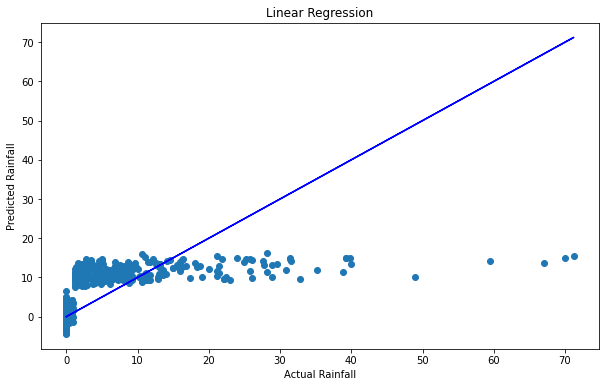

In [190]:
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predLR,cmap='set1')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Linear Regression")
plt.show()

## Random forest Regression Model

In [191]:
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor(n_estimators=600, random_state=28)
RFR.fit(x_train,y_train)

# prediction
predRFR=RFR.predict(x_test)
print('R2_Score:',r2_score(y_test,predRFR))
print('Mean abs error:',mean_absolute_error(y_test, predRFR))
print('Mean squared error:',mean_squared_error(y_test, predRFR))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predRFR)))

R2_Score: 0.4549553321415106
Mean abs error: 1.7676716090060407
Mean squared error: 25.652743458402004
Root Mean Squared Error:  5.064853745015941


### Checking the performance of the model by graph

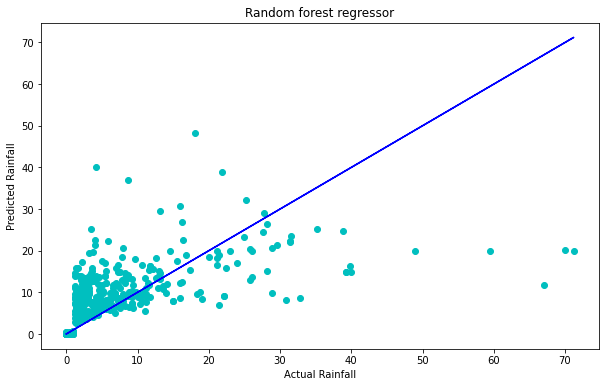

In [192]:
#Verifying the performance of the model by graph
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predRFR,color='c')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Random forest regressor")
plt.show()

## KNN Regressor

In [193]:
# Checking R2 score for KNN regressor
knn=KNeighborsRegressor(n_neighbors=9 )
knn.fit(x_train,y_train)

#prediction
predknn=knn.predict(x_test)
print('R2_Score:',r2_score(y_test,predknn))
print('Mean abs error:',mean_absolute_error(y_test, predknn))
print('Mean squared error:',mean_squared_error(y_test, predknn))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predknn)))

R2_Score: 0.3133789530260809
Mean abs error: 1.9961010433827566
Mean squared error: 32.316091890902435
Root Mean Squared Error:  5.684724434033934


### Checking the performance of the model by graph

Text(0.5, 1.0, 'K-nearest neighbors  regressor')

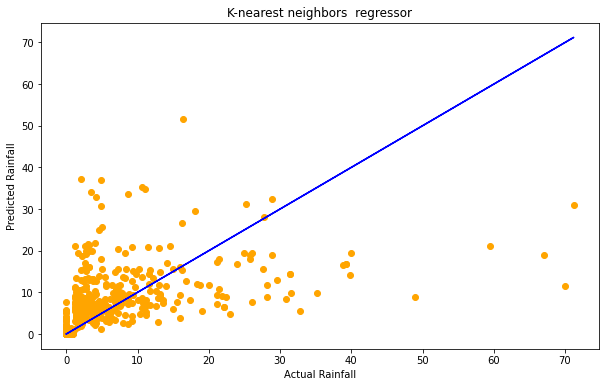

In [194]:
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predknn,color='orange')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("K-nearest neighbors  regressor")

## Support Vector Regression Model

In [195]:
# Checking R2 score for svr
sv= SVR(kernel='linear')
sv.fit(x_train,y_train)

#prediction
predsv=sv.predict(x_test)
print('R2_Score:',r2_score(y_test,predsv))
print('Mean abs error:',mean_absolute_error(y_test, predsv))
print('Mean squared error:',mean_squared_error(y_test, predsv))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predsv)))

R2_Score: 0.2901023192360397
Mean abs error: 1.75336832125464
Mean squared error: 33.41161589178327
Root Mean Squared Error:  5.780278184636383


### Checking the performance of the model by graph

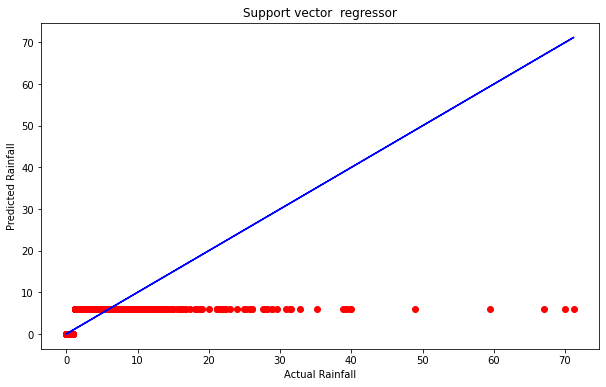

In [196]:
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predsv,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Support vector  regressor")
plt.show()

## Grdient boosting Regressor

In [197]:
# Checking R2 score for GBR
Gb= GradientBoostingRegressor(n_estimators=400,  random_state=29, learning_rate=0.1, max_depth=3)
Gb.fit(x_train,y_train)

#prediction
predGb=Gb.predict(x_test)
print('R2_Score:',r2_score(y_test,predGb))
print('Mean abs error:',mean_absolute_error(y_test, predGb))
print('Mean squared error:',mean_squared_error(y_test, predGb))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predGb)))

R2_Score: 0.4051998565909002
Mean abs error: 2.2238945331135382
Mean squared error: 27.994504648297703
Root Mean Squared Error:  5.290983334721222


### Checking the performance of the model by graph

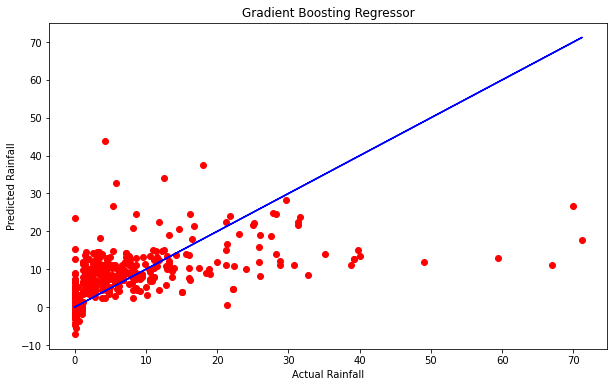

In [198]:
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predGb,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Gradient Boosting Regressor")
plt.show()

## Decision Tree Regressor

In [199]:
# Checking R2 score for GBR
DTR= DecisionTreeRegressor()
DTR.fit(x_train,y_train)

#prediction
predDTR=DTR.predict(x_test)
print('R2_Score:',r2_score(y_test,predDTR))
print('Mean abs error:',mean_absolute_error(y_test, predDTR))
print('Mean squared error:',mean_squared_error(y_test, predDTR))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predDTR)))

R2_Score: 0.1783380586952159
Mean abs error: 1.6235584843492588
Mean squared error: 38.67184514003294
Root Mean Squared Error:  6.218669081084227


### Checking the performance of the model by graph

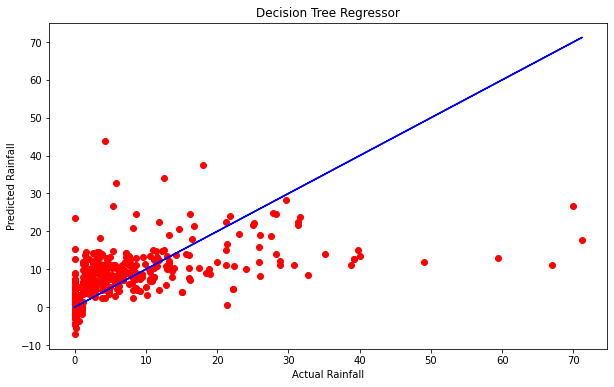

In [200]:
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predGb,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Decision Tree Regressor")
plt.show()

## LASSO Regression

In [201]:
# Checking R2 score for Lasso Regression
lasso = Lasso()
lasso.fit(x_train,y_train)

#prediction
predLasso=lasso.predict(x_test)
print('R2_Score:',r2_score(y_test,predLasso))
print('Mean abs error:',mean_absolute_error(y_test, predLasso))
print('Mean squared error:',mean_squared_error(y_test, predLasso))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predLasso)))

R2_Score: 0.36626938494641703
Mean abs error: 2.285868248214716
Mean squared error: 29.826782736136565
Root Mean Squared Error:  5.461390183473121


### Checking the performance of the model by graph

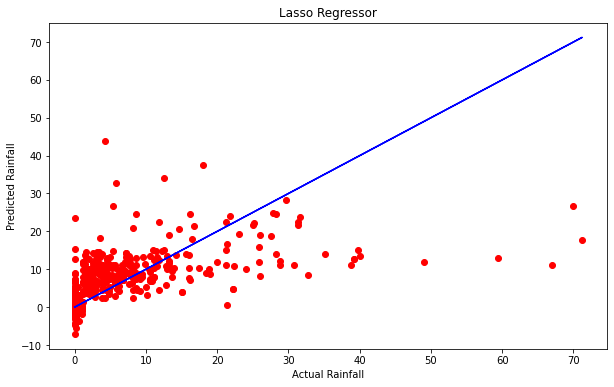

In [202]:
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predGb,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Lasso Regressor")
plt.show()

# Cross Validation Score for all the model

In [205]:
#CV Score for Linear Regression
print('CV score for Linear Regression: ',cross_val_score(LR,x,y,cv=5).mean())

CV score for Linear Regression:  0.2800582336739007


In [206]:
#CV Score for Random Forest Regression
print('CV score for Random forest Regression: ',cross_val_score(RFR,x,y,cv=5).mean())

CV score for Random forest Regression:  0.4026941246142039


In [207]:
#CV Score for KNN Regression
print('CV score for KNN Regression: ',cross_val_score(knn,x,y,cv=5).mean())

CV score for KNN Regression:  0.3376173365924379


In [208]:
#CV Score for Support Vector Regression
print('CV score for Support Vector  Regression: ',cross_val_score(sv,x,y,cv=5).mean())

CV score for Support Vector  Regression:  0.20198169975216093


In [209]:
#CV Score for Gradient Boosting Regression
print('CV score for Gradient Boosting Regression: ',cross_val_score(Gb,x,y,cv=5).mean())

CV score for Gradient Boosting Regression:  0.3448726227835427


In [210]:
#CV Score for Decision Tree Regression
print('CV score for Decision Tree Regression: ',cross_val_score(DTR,x,y,cv=7).mean())

CV score for Decision Tree Regression:  0.08066475851974711


In [211]:
#CV Score for LASSO Regression
print('CV score for LASSO Regression: ',cross_val_score(lasso,x,y,cv=5).mean())

CV score for LASSO Regression:  0.2644132931766995


##### From the observation of accuracy and cross validation score and their difference we can predict that Random Forest Regressor is the best model.

# Hyper Parameter Tuning
## The Random Forest Regressor with GridsearchCV

In [212]:
RFR=RandomForestRegressor(n_estimators = 500, random_state = 1, n_jobs = -1)

In [238]:
#param_grid = {'max_features' : ["auto", "sqrt", "log2"],
#              'min_samples_split' : np.linspace(0.1, 1.0, 10),
#              'max_depth' : [x for x in range(1,20)]}

In [263]:
grid_params = {
                'criterion':['mse', 'mae'],
             'max_features':['auto', 'sqrt', 'log2'],
             'n_estimators':[0,200],
             'max_depth':[2,4,6]
                }

In [264]:
CV_RFR = GridSearchCV(RandomForestRegressor(), grid_params, cv = 5)

In [265]:
CV_RFR.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['mse', 'mae'], 'max_depth': [2, 4, 6],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [0, 200]})

In [266]:
CV_RFR.best_params_

{'criterion': 'mse',
 'max_depth': 6,
 'max_features': 'log2',
 'n_estimators': 200}

In [269]:
Rain_forecast = RandomForestRegressor(random_state=50, n_estimators=200,max_depth= 6, max_features= 'log2')
Rain_forecast.fit(x_train, y_train)
#prediction
RFRpred = Rain_forecast.predict(x_test)
#R2 score
acc = r2_score(y_test,RFRpred)
print(acc*100)

45.49372038619077


#### So, after the Hypertuning now we got a accuracy score of 45% on Random Forest Regression

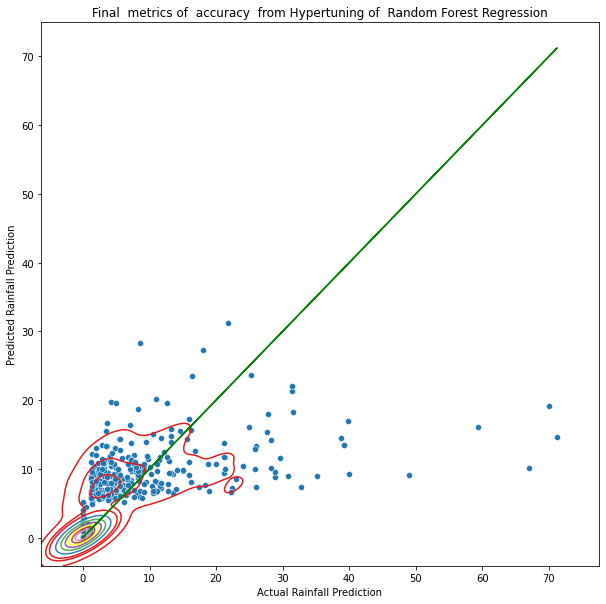

In [270]:
#Verifying the final  performance of the model by graph
plt.figure(figsize=(10,10))
sns.scatterplot(x=y_test,y=RFRpred,palette='Set2')
sns.kdeplot(x=y_test,y=RFRpred, cmap='Set1')
plt.plot(y_test,y_test,color='g')
#Verifying the performance of the model by graph
plt.xlabel("Actual Rainfall Prediction")
plt.ylabel("Predicted Rainfall Prediction")
plt.title("Final  metrics of  accuracy  from Hypertuning of  Random Forest Regression")
plt.show()

In [271]:
#saving the model at local file system
filename='Rainfall_Prediction.pickle'
pickle.dump(Rain_forecast,open(filename,'wb'))
#prediction using the saved model
loaded_model_r = pickle.load(open(filename, 'rb'))
loaded_model_r.predict(x_test)

array([ 0.33866829, 10.11140391,  6.2933605 , ...,  0.22422933,
        0.95356575,  0.14117827])

### Prediction of Regressor Model

In [275]:
import numpy as np
a = np.array(y_test)
predicted = np.array(loaded_model_r.predict(x_test))
Rainfall_Forecasting = pd.DataFrame({"Original":a,"Predicted":predicted},index= range(len(a)))
Rainfall_Forecasting

,Original,Predicted
0,0.0,0.338668
1,2.0,10.111404
2,6.2,6.293361
3,13.6,6.554126
4,0.0,0.125463
...,...,...
1209,28.8,9.516933
1210,0.0,0.049309
1211,0.0,0.224229
1212,0.0,0.953566


# Classification Model

### Finding the best random state among all the models

In [281]:
maxAccu=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x1,y1,test_size=.30, random_state =i)
    DTC = DecisionTreeClassifier()
    DTC.fit(x_train, y_train)
    pred = DTC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8831640058055152  on Random_state  37


## Creating train-test-split

In [282]:
# creating new train test split using the random state.
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=.30,random_state=maxRS)

In [283]:
x1.shape, y1.shape

((9184, 17), (9184,))

In [284]:
x_train.shape,y_train.shape, x_test.shape,y_test.shape

((6428, 17), (6428,), (2756, 17), (2756,))

## Random Forest Classifier

In [286]:
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(x_train,y_train)
pred_rfc = rfc.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_rfc))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_rfc))
print("classification_report: \n",classification_report(y_test,pred_rfc))

accuracy_score:  0.9317851959361393
confusion_matrix: 
 [[1313   92]
 [  96 1255]]
classification_report: 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93      1405
           1       0.93      0.93      0.93      1351

    accuracy                           0.93      2756
   macro avg       0.93      0.93      0.93      2756
weighted avg       0.93      0.93      0.93      2756



### Confusion Matrix for RFC

Text(0.5, 1.0, 'RFC prediction Confusion_matrix')

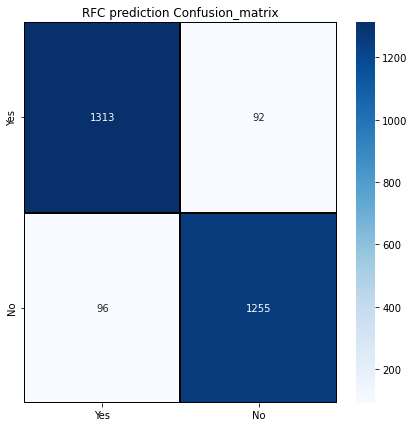

In [287]:
cm = confusion_matrix(y_test,pred_rfc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("RFC prediction Confusion_matrix")

## Decision Tree Classifier

In [288]:
dtc = DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred_dtc = dtc.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_dtc))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_dtc))
print("classification_report: \n",classification_report(y_test,pred_dtc))

accuracy_score:  0.8715529753265603
confusion_matrix: 
 [[1221  184]
 [ 170 1181]]
classification_report: 
               precision    recall  f1-score   support

           0       0.88      0.87      0.87      1405
           1       0.87      0.87      0.87      1351

    accuracy                           0.87      2756
   macro avg       0.87      0.87      0.87      2756
weighted avg       0.87      0.87      0.87      2756



### Confusion Matrix for DTC

Text(0.5, 1.0, 'DTC prediction Confusion_matrix')

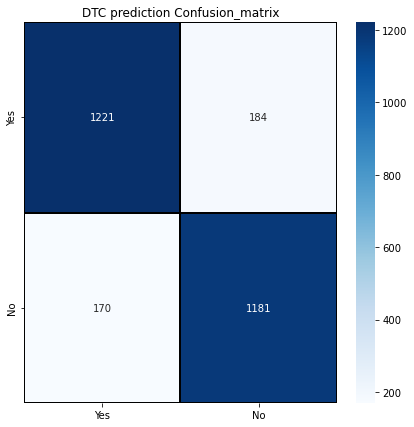

In [289]:
cm = confusion_matrix(y_test,pred_dtc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("DTC prediction Confusion_matrix")

## Support Vector Machine Classifier

In [290]:
svc = SVC(kernel='linear', gamma=3)
svc.fit(x_train,y_train)
pred_svc = svc.predict(x_test)

print("accuracy_score: ", accuracy_score(y_test, pred_svc))
print("confusion_matrix: \n", confusion_matrix(y_test, pred_svc))
print("classification_report: \n", classification_report(y_test,pred_svc))

accuracy_score:  0.8076923076923077
confusion_matrix: 
 [[1148  257]
 [ 273 1078]]
classification_report: 
               precision    recall  f1-score   support

           0       0.81      0.82      0.81      1405
           1       0.81      0.80      0.80      1351

    accuracy                           0.81      2756
   macro avg       0.81      0.81      0.81      2756
weighted avg       0.81      0.81      0.81      2756



### Confusion Matrix for SVC

Text(0.5, 1.0, 'SVC prediction Confusion_matrix')

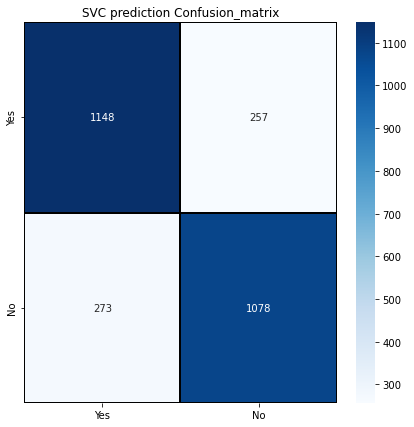

In [291]:
cm = confusion_matrix(y_test,pred_svc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("SVC prediction Confusion_matrix")

## KNN Classifier

In [293]:
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)
pred_knn = knn.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_knn))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_knn))
print("classification_report: \n",classification_report(y_test,pred_knn))

accuracy_score:  0.8646589259796807
confusion_matrix: 
 [[1102  303]
 [  70 1281]]
classification_report: 
               precision    recall  f1-score   support

           0       0.94      0.78      0.86      1405
           1       0.81      0.95      0.87      1351

    accuracy                           0.86      2756
   macro avg       0.87      0.87      0.86      2756
weighted avg       0.88      0.86      0.86      2756



### Confusion Matrix for KNN classifier

Text(0.5, 1.0, 'KNN prediction Confusion_matrix')

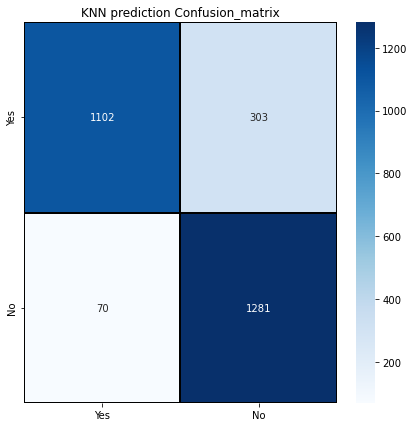

In [294]:
cm = confusion_matrix(y_test,pred_knn)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("KNN prediction Confusion_matrix")

## Gradient Boosting Classifier

In [295]:
gb = GradientBoostingClassifier(n_estimators =100,learning_rate=0.1, max_depth=4)
gb.fit(x_train,y_train)
pred_gb = gb.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_gb))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_gb))
print("classification_report: \n",classification_report(y_test,pred_gb))

accuracy_score:  0.8958635703918723
confusion_matrix: 
 [[1268  137]
 [ 150 1201]]
classification_report: 
               precision    recall  f1-score   support

           0       0.89      0.90      0.90      1405
           1       0.90      0.89      0.89      1351

    accuracy                           0.90      2756
   macro avg       0.90      0.90      0.90      2756
weighted avg       0.90      0.90      0.90      2756



### Confusion Matrix for Gradient Boosting classifier

Text(0.5, 1.0, 'Gradient Boosting classifier prediction Confusion_matrix')

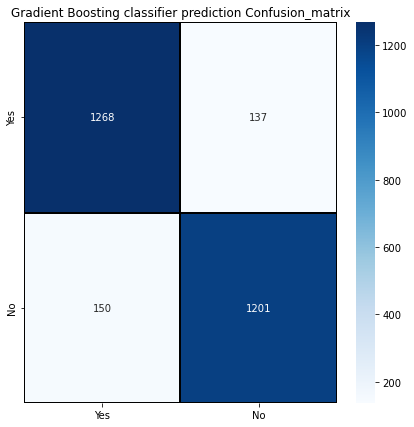

In [296]:
cm = confusion_matrix(y_test,pred_gb)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("Gradient Boosting classifier prediction Confusion_matrix")

# Cross Validation Score for all the model

In [297]:
#CV Score for Random Forest Classifier
print('CV score for Random forest Classifier: ',cross_val_score(RFR,x1,y1,cv=5).mean())

#CV Score for Decision Tree Classifier
print('CV score for Decision Tree Classifier: ',cross_val_score(DTR,x1,y1,cv=5).mean())

#CV Score for Support Vector Classifier
print('CV score for Support Vector  Classifier: ',cross_val_score(sv,x1,y1,cv=5).mean())

#CV Score for KNN Classifier
print('CV score for KNN Classifier: ',cross_val_score(knn,x1,y1,cv=5).mean())

#CV Score for Gradient Boosting Classifier
print('CV score for Gradient Boosting Classifier: ',cross_val_score(Gb,x1,y1, cv=5).mean())

CV score for Random forest Classifier:  0.41837419384147356
CV score for Decision Tree Classifier:  0.029680028274862203
CV score for Support Vector  Classifier:  0.08392055236942772
CV score for KNN Classifier:  0.8043389157513848
CV score for Gradient Boosting Classifier:  0.35544407347427365


## ROC & AUC Curve for all model

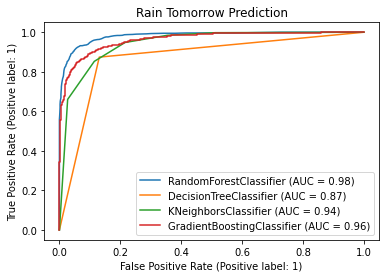

In [300]:
#Lets plot roc curve and check auc and performance of all algorithms
from sklearn.metrics import plot_roc_curve
disp = plot_roc_curve(rfc, x_test, y_test)
plot_roc_curve(dtc, x_test, y_test, ax = disp.ax_)
plot_roc_curve(knn, x_test, y_test, ax = disp.ax_)
plot_roc_curve(gb, x_test, y_test, ax = disp.ax_)
plt.title("Rain Tomorrow Prediction")
plt.legend(prop={"size" :10} ,loc = 'lower right')
plt.show()

#### Based on the Accuracy Score and Cross-validation Score and performance of the model we will select Random Forest Classifier as the best model compare to Gradient Boosting Classifier.

# Hyper parameter tuning

## The Random Forest Classifier with GridsearchCV

In [301]:
x_train,x_test,y_train,y_test = train_test_split(x1,y1,test_size = .30, random_state = 42)

In [312]:
rfc=RandomForestClassifier(random_state=30)

In [313]:
grid_params = {
                'criterion':['gini','entropy'],
                'max_depth': [15,20,22],
                'n_estimators':[700,900,1000],
                'min_samples_leaf': [1]
                }

In [314]:
CV_rfc = GridSearchCV(RandomForestClassifier(), grid_params, cv = 5)

In [315]:
CV_rfc.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [15, 20, 22], 'min_samples_leaf': [1],
                         'n_estimators': [700, 900, 1000]})

In [316]:
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 22,
 'min_samples_leaf': 1,
 'n_estimators': 900}

In [317]:
Weather_Forecast=RandomForestClassifier(random_state=50, max_features='auto', n_estimators= 900, max_depth=22, criterion='entropy')
Weather_Forecast.fit(x_train,y_train)
predict=Weather_Forecast.predict(x_test)
print("accuracy score: ",accuracy_score(y_test,predict))
print("confusion_matrix: \n",confusion_matrix(y_test,predict))
print("classification_report: \n",classification_report(y_test,predict))

accuracy score:  0.9263425253991292
confusion_matrix: 
 [[1280  118]
 [  85 1273]]
classification_report: 
               precision    recall  f1-score   support

           0       0.94      0.92      0.93      1398
           1       0.92      0.94      0.93      1358

    accuracy                           0.93      2756
   macro avg       0.93      0.93      0.93      2756
weighted avg       0.93      0.93      0.93      2756



### Confusion Matrix

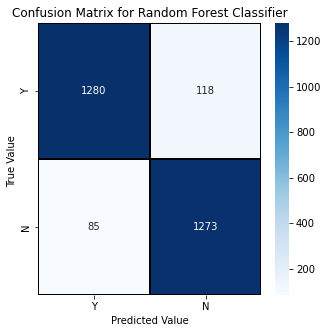

In [318]:
cm = confusion_matrix(y_test, predict)

x_axis_labels = ["Y","N"]
y_axis_labels = ["Y","N"]

f, ax = plt.subplots(figsize =(5,5))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("Predicted Value")
plt.ylabel("True Value ")
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

## ROC-AUC Curve

In [319]:
fpr, tpr, threshold = roc_curve(y_test,predict)
auc = roc_auc_score(y_test,predict)

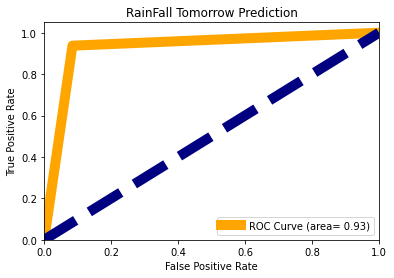

In [320]:
plt.figure()
plt.plot(fpr,tpr,color="orange",lw=10,label="ROC Curve (area= %0.2f)" % auc)
plt.plot([0,1],[0,1],color="navy",lw=10,linestyle="--")
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("RainFall Tomorrow Prediction")
plt.legend(loc="lower right")
plt.show()

This is the AUC-ROC curve for the models which is plotted False positive rate against True positive rate. So the best model has the area under curve as 0.93.

## Saving the Model

In [321]:
import pickle
filename='RainFall_Tomorrow_Predict.pickle'
pickle.dump(Weather_Forecast,open(filename,'wb'))
loaded_model = pickle.load(open(filename, 'rb'))
loaded_model.predict(x_test)

array([0, 1, 0, ..., 0, 0, 0])

## Checking predicted and original values

In [322]:
a =np.array(y_test)
predicted=np.array(loaded_model.predict(x_test))
RainFall_Tomorrow_Prediction=pd.DataFrame({'Orginal':a,'Predicted':predicted}, index=range(len(a)))
RainFall_Tomorrow_Prediction

,Orginal,Predicted
0,0,0
1,1,1
2,0,0
3,0,0
4,0,0
...,...,...
2751,0,0
2752,1,1
2753,0,0
2754,1,0


As we can see, predicted and original values matches approx 100%.

In [323]:
model =RainFall_Tomorrow_Prediction.to_csv('RainFall_Tomorrow_Prediction.csv')
model

##### Model Prediction saved in CSV format